<a href="https://colab.research.google.com/github/vir-k01/ML-and-DL/blob/main/Copy_of_Copy_of_Per_Class_WACGAN_50P_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://github.com/bobchennan/Wasserstein-GAN-Keras/blob/master/mnist_wacgan.py
https://gist.github.com/myurasov/7879aa83953909b74891202a0944cf9d

https://www.kaggle.com/amanooo/wgan-gp-keras/notebook

https://github.com/eriklindernoren/Keras-GAN/blob/master/wgan_gp/wgan_gp.py

https://keras.io/examples/generative/wgan_gp/

https://www.me.iastate.edu/bglab/files/2018/11/Physics-aware-Deep-Generative-Models-for-Creating-Synthetic-Microstructures.pdf

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

# Install TensorFlow
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.datasets.fashion_mnist import load_data
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [ ]:
from keras.utils.vis_utils import plot_model

In [ ]:
!pip install keras==2.3.1

     |████████████████████████████████| 378kB 21.5MB/s 
     |████████████████████████████████| 51kB 8.4MB/s 
  Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully uninstalled Keras-2.4.3


In [ ]:
from skimage import transform
from skimage.transform import rotate, AffineTransform
from skimage.util import random_noise
from skimage.filters import gaussian
from scipy import ndimage
import pylab as pl
from PIL import Image

In [ ]:
from skimage.measure import compare_ssim as ssim

In [ ]:
np.random.seed = 42

In [ ]:
!pip install bayesian-optimization

  Created wheel for bayesian-optimization: filename=bayesian_optimization-1.2.0-cp36-none-any.whl size=11685 sha256=fb8cedc07e9a544fadddcbc22e161edacd9f51d087bd71c9ba7eb47159bde62a
  Stored in directory: /root/.cache/pip/wheels/5a/56/ae/e0e3c1fc1954dc3ec712e2df547235ed072b448094d8f94aec
Successfully built bayesian-optimization


In [ ]:
from functools import partial
from bayes_opt import BayesianOptimization

In [ ]:
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint

In [ ]:
def read_store_data(filepath):
  readfile = open(filepath, "r")
  arr1 =[]
  for line in readfile:
    Type = line.split(" ")
    arr1.append(Type)
  arr1 = np.asarray(arr1)
  arr1 = arr1.astype(np.float)
  arr1 = np.squeeze(arr1)
  arr4 = arr1[:, 2]
  arr4 = np.reshape(arr4, (256,256))
  plt.imshow(arr4, cmap = 'gray')
  return arr4

In [ ]:
def store_array(im, filename):
  fil = open(str(filename) + '.txt', 'w')
  row, column = im.shape
  for y in range(column):
      for x in range(row):
          pixel = im[y, x]
          fil.write(str(x+1) + " " + str(y+1) + " " + str(pixel) + '\n')
  fil.close()

In [ ]:
from scipy.ndimage.interpolation import shift
def shift_image(image, dx, dy):
    image = image.reshape((256, 256))
    shifted_image = shift(image, [dy, dx], cval=0, mode="constant")
    return shifted_image

In [ ]:
def smooth_labels(labels, factor=0.1):
	# smooth the labels
	labels *= (1 - factor)
	labels += (factor / labels.shape[0])
	# returned the smoothed labels
	return labels

In [ ]:
from skimage import filters
def convert_image(img_smp):
  thres = filters.threshold_mean(img_smp)
  Y = []
  for i in range(img_smp.shape[0]):
    for j in range(img_smp.shape[1]):
      if img_smp[i, j] > thres:
        Y.append(0.0)
      else:
        Y.append(1.0)
  Y = np.asarray(Y)
  Y = Y.reshape((img_smp.shape[0],img_smp.shape[1]))
  return Y

  

In [ ]:
def check_quality(img):
  ss = []
  for index in range(int(X_train.shape[0]/10)):
    ss.append(ssim(img, X_train[index], multichannel = True))
  return max(ss)


In [ ]:
def randRange(a, b):
    '''
    a utility functio to generate random float values in desired range
    '''
    return pl.rand() * (b - a) + a


In [ ]:
def randomCrop(im, margin = 1/10):
    '''
    croping the image in the center from a random margin from the borders
    '''
    #margin = 1/10
    start = [int(randRange(0, im.shape[0] * margin)),
             int(randRange(0, im.shape[1] * margin))]
    end = [int(randRange(im.shape[0] * (1-margin), im.shape[0])), 
           int(randRange(im.shape[1] * (1-margin), im.shape[1]))]
    return im[start[0]:end[0], start[1]:end[1]]


In [ ]:
def random_crop(img, width, height):
    assert img.shape[0] >= height
    assert img.shape[1] >= width
    x = np.random.randint(0, img.shape[1] - width)
    y = np.random.randint(0, img.shape[0] - height)
    img = img[y:y+height, x:x+width]
    return img

In [ ]:
def read_many_disk(Shift, Flip, Rotate, Crop, num_classes, set_class_id = 0, num_images = 50, Angle = 90, width = 64, height =64):
    """ Reads image from disk.
        Parameters:
        ---------------
        num_images   number of images to read

        Returns:
        ----------
        images      images array, (N, 32, 32, 3) to be stored
        labels      associated meta data, int label (N, 1)
    """
    images, labels = [], []

    # Loop over all IDs and read each image in one by one

    for image_id in range(num_images +1):
      if image_id:
          images.append(np.array(read_store_data('/content/2D_Phase_50/Class_'+ f'{set_class_id}/'+ f'{image_id}.txt')))
    
    '''for i in range(50):
        labels.append(set_class_id)'''

    for j in range(num_classes):
      for i in range(50):
        labels.append(j)
    '''for class_id in range(num_classes+1):
      if class_id:
        for image_id in range(num_images+1):
          if image_id:
            images.append(np.array(read_store_data('/content/2D_Phase_50/Class_'+ f'{class_id}/'+ f'{image_id}.txt')))'''

    data = np.asarray(images)
    labels = np.asarray(labels)
    labels = labels.astype(np.float64)
  
    #labels = smooth_labels(labels)
    X_train_1 = []
    y_train_1 = []
    X_train_augmented = [image for image in data]
    y_train_augmented = [label for label in labels]

    for dx, dy in ((1, 0), (-1, 0), (0, 1), (0, -1)):
        for image, label in zip(data, labels):
          if Shift:
            X_train_augmented.append(shift_image(image, dx, dy))
            y_train_augmented.append(label)
          if Flip:
            X_train_augmented.append(np.fliplr(image))
            X_train_augmented.append(np.flipud(image))
            y_train_augmented.append(label)
            y_train_augmented.append(label)
          if Rotate:
            for i in [90, 180, 270]:
              X_train_augmented.append(rotate(image, angle= i))
              y_train_augmented.append(label)
          '''if Crop:
            X_train_1.append(random_crop(image, width, height))
            y_train_1.append(label)
              #cropped_image = X_train_augmented[i, x[i]:x[i]+16, y[i]:y[i]+16]'''
    X_train_augmented = np.array(X_train_augmented)
    y_train_augmented = np.array(y_train_augmented)
    
    if Crop:
      for image in X_train_augmented:
        for label in y_train_augmented:
          X_train_1.append(random_crop(image, width, height))
          y_train_1.append(label)    
      X_train_1 = np.array(X_train_1)
      y_train_1 = np.array(y_train_1)
      return [X_train_1, y_train_1]  
    else:
      '''for i in X_train_augmented.shape[0]:
        X_train_augmented.append(random_crop(X_train_augmented[i], width, height))
        y_train_augmented.append(y_train_augmented)'''



      return [X_train_augmented, y_train_augmented]

In [ ]:
tf.reduce_sum(X_train[0])

<tf.Tensor: shape=(), dtype=float64, numpy=32196.0>

In [ ]:
from keras import backend as K

def mod_wasserstein_loss(y_true, y_pred):
  return K.mean(y_true* y_pred) + ((tf.reduce_sum(y_true)/(256*256))- 0.5)
# implementation of wasserstein loss
def wasserstein_loss(y_true, y_pred):
	return K.mean(y_true * y_pred)

In [ ]:
!pip install -q -U tensorflow-addons

     |████████████████████████████████| 706kB 8.1MB/s 


In [ ]:
import tensorflow_addons as tfa

In [ ]:
from tensorflow_addons.layers import SpectralNormalization

In [ ]:
from __future__ import print_function, division

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, multiply
from keras.layers import BatchNormalization, Activation, Embedding, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam

import matplotlib.pyplot as plt

import numpy as np

class ACGAN():
    def __init__(self, input_rows, input_cols, input_channels, input_classes, lr, gen_block_5, gen_block_neu, dis_block_5, dis_block_neu, latent_dim=100):
        # Input shape
        self.img_rows = input_rows
        self.img_cols = input_cols
        self.channels = input_channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.num_classes = input_classes
        self.latent_dim = latent_dim

        optimizer = Adam(lr, 0.5)
        #optimizer = keras.optimizers.RMSprop(0.0005)
        losses = [wasserstein_loss, 'sparse_categorical_crossentropy']
        #losses_1 = [mod_wasserstein_loss, 'sparse_categorical_crossentropy']

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator(dis_block_5, dis_block_neu)
        self.discriminator.compile(loss=losses,
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator(gen_block_5, gen_block_neu)

        # The generator takes noise and the target label as input
        # and generates the corresponding digit of that label
        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(1,))
        img = self.generator([noise, label])

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated image as input and determines validity
        # and the label of that image
        valid, target_label = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model([noise, label], [valid, target_label])
        self.combined.compile(loss=losses,
            optimizer=optimizer)

    def build_generator(self, gen_block_5, gen_block_neu):


        model = Sequential()


        model.add(Dense(gen_block_neu * 16 * 16 *(2 - gen_block_5) * (2 - gen_block_5), activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((16 * (2 - gen_block_5) , 16 * (2 - gen_block_5), gen_block_neu)))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(UpSampling2D())
        #model.add(Conv2D(256, kernel_size=3, padding="same"))
        #model.add(Activation("relu"))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(128, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(64, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
       # model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(32, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        if gen_block_5:
          model.add(UpSampling2D())
          model.add(Conv2D(16, kernel_size=3, padding="same"))
          model.add(Activation("relu"))
          #model.add(LeakyReLU(alpha=0.2))
          model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(self.channels, kernel_size=3, padding='same'))
        model.add(Activation("tanh"))

        #model.summary()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(1,), dtype='int32')
        label_embedding = Flatten()(Embedding(self.num_classes, 100)(label))

        model_input = multiply([noise, label_embedding])
        img = model(model_input)

        return Model([noise, label], img)

    def build_discriminator(self, dis_block_5, dis_block_neu):

        model = Sequential()
        #model.add(keras.layers.GaussianNoise(0.1, input_shape = self.img_shape ))

        model.add(SpectralNormalization(Conv2D(16, kernel_size=3, strides=2, padding="same", input_shape = self.img_shape)))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(SpectralNormalization(Conv2D(32, kernel_size=3, strides=2, padding="same")))
        model.add(ZeroPadding2D(padding=((0,1),(0,1))))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(SpectralNormalization(Conv2D(64, kernel_size=3, strides=2, padding="same")))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(SpectralNormalization(Conv2D(dis_block_neu, kernel_size=3, strides=2, padding="same")))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        #model.add(BatchNormalization(momentum=0.8))
        if dis_block_5:
          model.add(SpectralNormalization(Conv2D(dis_block_neu, kernel_size=3, strides=1, padding="same")))
          model.add(LeakyReLU(alpha=0.2))
          model.add(Dropout(0.25))
        #model.add(Dense(1024))
        #model.add(Dropout(0.25))

        model.add(Flatten())
        #model.summary()

        img = Input(shape=self.img_shape)

        # Extract feature representation
        features = model(img)

        # Determine validity and label of the image
        validity = Dense(1, activation="linear")(features)
        label = Dense(self.num_classes+1, activation="sigmoid")(features)

        return Model(img, [validity, label])

    def train(self, X_train, y_train, epochs=4000, n_critic= 5, batch_size=128, sample_interval=50):

        # Load the dataset
        #(X_train, y_train), (_, _) = mnist.load_data()
        #X_train, y_train = self.X_train, self.y_train

        # Configure inputs
        #X_train = (X_train.astype(np.float32) - 127.5) / 127.5
        print(np.shape(X_train))
        X_train = np.expand_dims(X_train, axis=3)
        y_train = y_train.reshape(-1, 1)
        print(np.shape(X_train))

        # Adversarial ground truths
        valid = smooth_labels(np.ones((batch_size, 1)))
        fake = smooth_labels(-np.ones((batch_size, 1)))

        # Loss output
        g_loss_epochs = np.zeros((epochs, 1))
        d_loss_epochs = np.zeros((epochs, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------
            for j in range(n_critic):
              for l in self.discriminator.layers:
                weights = l.get_weights()
                weights = [np.clip(w, -0.01, 0.01) for w in weights]
                l.set_weights(weights)

              # Select a random batch of images
              idx = np.random.randint(0, X_train.shape[0], batch_size)
              imgs = X_train[idx]

              # Sample noise as generator input
              noise = np.random.normal(0, 1, (batch_size, 100))

              # The labels of the digits that the generator tries to create an
              # image representation of
              sampled_labels = np.random.randint(0, input_classes, (batch_size, 1))

              # Generate a half batch of new images
              gen_imgs = self.generator.predict([noise, sampled_labels])

              # Image labels. 0-9 if image is valid or 10 if it is generated (fake)
              img_labels = y_train[idx]
              fake_labels = self.num_classes * np.ones(img_labels.shape)

              # Train the discriminator
              d_loss_real = self.discriminator.train_on_batch(imgs, [valid, img_labels])
              d_loss_fake = self.discriminator.train_on_batch(gen_imgs, [fake, fake_labels])
              d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            # Train the generator
            g_loss = self.combined.train_on_batch([noise, sampled_labels], [valid, sampled_labels])

            #show the final losses
            g_loss_epochs[epoch] = g_loss[0]
            d_loss_epochs[epoch] = d_loss[0]

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                # Plot the progress
                print ("Epoch: %d [D loss: %f, acc.: %.2f%%, op_acc: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[3], 100*d_loss[4], g_loss[0]))
                #do not save model
                self.save_model(epoch)
                self.sample_images(epoch, smp_rows=2, smp_cols=self.num_classes, save_img=False)
                yan = np.random.normal(0, 1, (self.num_classes, 100))
                '''for i in range(self.num_classes):
                  img_smp = self.generator.predict([yan, np.array(0).reshape(1, )])[i, :, :, 0]
                  img_smp = img_smp*0.5 + 0.5
                  img_smp = convert_image(img_smp)
                  plt.imshow(img_smp, cmap = 'gray')
                  plt.show()
                  #ss = ssim(img_smp, ci)
                  pf = np.sum(img_smp)/(input_rows * input_cols)
                  #print('ssim class '+ f'{i} epoch' + f'{epoch} :' + f'{ss}')
                  print('pf class ' + f'{i} epoch' f'{epoch} :' + f'{pf}')'''

        return g_loss_epochs, d_loss_epochs
 

    #row, cols to be sampled
    def sample_images(self, epoch, convert = 1, smp_rows=5, smp_cols=7, save_img=False, fig_size=(8, 3)):
        r, c = smp_rows, smp_cols
        noise = np.random.normal(0, 1, (r * c, 100))
        sampled_labels = np.array([num for _ in range(r) for num in range(c)])
        gen_imgs = self.generator.predict([noise, sampled_labels])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5
        for i in range(self.num_classes):
          plt.imshow(gen_imgs[i, :, :, 0], cmap = 'gray')
          if convert:
            plt.imshow(convert_image(gen_imgs[i, :, :, 0]), cmap = 'gray')
            print('pf class '+ f'{i} epoch ' + f'{epoch} : %.2f', (np.sum(convert_image(gen_imgs[i, :, :, 0]))/(input_rows * input_cols)))
          plt.show()

        plt.figure(figsize=fig_size)
        #plt.imshow(gen_imgs[0, :, :, 0], cmap = 'gray')
        fig, axs = plt.subplots(r, c, figsize=fig_size)
        cnt = 0
        for i in range(r):
            #for j in range(c):
              axs[i].imshow(gen_imgs[0,:,:,0], cmap='gray')
              axs[i].axis('off')
              #cnt += 1
        if save_img:
            fig.savefig("../images/%d.png" % epoch)
        else:
            #plt.figure(figsize=fig_size)
            plt.show()
        plt.close()
    def compare_output(self):
        ss = []
        noise = np.random.normal(0, 1, (5 * 7, 100))
        gen_img = self.sample_single_image(noise, 0, show = 0)
        for i in X_train:
          ss = ssim(gen_img, i)
        return max(ss)


    def sample_single_image(self, noise, label, convert = 1, show = 1):
        gen_imgs = self.generator.predict([noise, np.array(label).reshape((1, ))])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5
        if convert:
          gen_imgs = convert_image(gen_imgs)
        if show:
          plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
        else:
          return gen_imgs

    def save_model(self, epoch):

        def save(model, model_name):
            model_path = "single_" + "%s.json" % model_name
            weights_path = "single" + f'{epoch}' +"%s_weights.hdf5" % model_name
            options = {"file_arch": model_path,
                        "file_weight": weights_path}
            json_string = model.to_json()
            #
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])
        #self.generator.model.save(f'{epoch} gen.h5')
        #self.discriminator.model.save(f'{epoch} dis.h5')

        save(self.generator, "generator")
        save(self.discriminator, "discriminator")

In [ ]:
!pip install scikit-optimize
from skopt.space import Real, Integer

     |████████████████████████████████| 102kB 8.4MB/s 


In [ ]:
from skopt import gp_minimize
from skopt.utils import use_named_args
from skopt import callbacks
from skopt.callbacks import CheckpointSaver

In [ ]:
dim_learning_rate = Real(low=1e-5, high=1e-3, prior='log-uniform',
                         name='lr')
dim_num_dense_layers_gen = Integer(low=0, high=1, name='num_dense_layers_gen')
dim_num_dense_nodes_gen = Integer(low=128, high=512, name='num_dense_nodes_gen')
#dim_num_dense_nodes_gen = [128,256,512]
#dim_num_dense_nodes_dis = [128,256,512]
dim_num_dense_layers_dis = Integer(low=0, high=1, name='num_dense_layers_dis')
dim_num_dense_nodes_dis = Integer(low=128, high=512, name='num_dense_nodes_dis')
dim_n_critic = Integer(low = 1, high = 5, name = 'n_critic')

In [ ]:
default_parameters = [1e-6, 0, 0, 128, 128, 5]

In [ ]:
dimensions = [dim_learning_rate,
              #dim_num_dense_layers_gen,
              #dim_num_dense_layers_dis,
              #dim_num_dense_nodes_gen,
              #dim_num_dense_nodes_dis,
              dim_n_critic]

In [ ]:
path_best_model = 'best_model.h5'

In [ ]:
@use_named_args(dimensions=dimensions)
def fitness(lr , n_critic, num_dense_layers_gen = 1, num_dense_layers_dis= 1, num_dense_nodes_gen = 128,
            num_dense_nodes_dis = 128):
    """
    Hyper-parameters:
    learning_rate:     Learning-rate for the optimizer.
    num_dense_layers:  Number of dense layers.
    num_dense_nodes:   Number of nodes in each dense layer.
    activation:        Activation function for all layers.
    """

    # Print the hyper-parameters.
    print('learning rate: {0:.1e}'.format(lr))
    print('num_dense_layers_gen:' ,  num_dense_layers_gen)
    print('num_dense_layers_dis:', num_dense_layers_dis)
    print('num_dense_nodes_gen:', num_dense_nodes_gen)
    print('num_dense_nodes_dis:', num_dense_nodes_dis)
    print('n_critic:', n_critic)
    print()
    
    # Create the neural network with these hyper-parameters.
    model = ACGAN(input_rows, input_cols, input_channels, input_classes, lr, num_dense_layers_gen, num_dense_nodes_gen, num_dense_layers_dis, num_dense_nodes_dis)
    '''# Dir-name for the TensorBoard log-files.
    log_dir = log_dir_name(learning_rate, num_dense_layers,
                           num_dense_nodes, activation)
    
    # Create a callback-function for Keras which will be
    # run after each epoch has ended during training.
    # This saves the log-files for TensorBoard.
    # Note that there are complications when histogram_freq=1.
    # It might give strange errors and it also does not properly
    # support Keras data-generators for the validation-set.
    callback_log = TensorBoard(
        log_dir=log_dir,
        histogram_freq=0,
        write_graph=True,
        write_grads=False,
        write_images=False)
   
    # Use Keras to train the model.
    history = model.fit(x= X_train,
                        y= y_train,
                        epochs=3,
                        batch_size=128,
                        validation_data=validation_data,
                        callbacks=[callback_log])

    # Get the classification accuracy on the validation-set
    # after the last training-epoch.
    accuracy = history.history['val_accuracy'][-1]'''
    model.train(X_train, y_train, n_critic= n_critic, epochs = 4000, batch_size=128, sample_interval= 100)
    yan = np.random.normal(0, 1, (1, 100))
    img_smp = model.generator.predict([yan, np.array(0).reshape(1, )])[0, :, :, 0]
    img_smp = img_smp*0.5 + 0.5
    img_smp = convert_image(img_smp)
    ss = np.abs(check_quality(img_smp))

    # Print the classification accuracy.
    print()
    print("SSIM: {0:.2%}".format(ss))
    print()

    # Save the model if it improves on the best-found performance.
    # We use the global keyword so we update the variable outside
    # of this function.
    global best_ss

    # If the classification accuracy of the saved model is improved ...
    if ss > best_ss:
        # Save the new model to harddisk.
        model.generator.save(path_best_model)
        # Update the classification accuracy.
        best_ss = ss

    # Delete the Keras model with these hyper-parameters from memory.
    del model
    
    # Clear the Keras session, otherwise it will keep adding new
    # models to the same TensorFlow graph each time we create
    # a model with a different set of hyper-parameters.
    K.clear_session()
    
    # NOTE: Scikit-optimize does minimization so it tries to
    # find a set of hyper-parameters with the LOWEST fitness-value.
    # Because we are interested in the HIGHEST classification
    # accuracy, we need to negate this number so it can be minimized.
    return -ss

In [ ]:
best_ss = 0

In [ ]:
fitness(x= default_parameters)

learning rate: 1.0e-06
num_dense_layers_gen: 0
num_dense_layers_dis: 0
num_dense_nodes_gen: 128
num_dense_nodes_dis: 128
n_critic: 5

(1050, 256, 256)
(1050, 256, 256, 1)


KeyboardInterrupt: ignored

In [ ]:
#to load from checkpoints, run and add x0 and y0 arguements in gp_minimize
from skopt import load

res = load('/content/class7-checkpoint (7).pkl')
x0 = res.x_iters
y0 = res.func_vals

In [ ]:
checkpoint_saver = CheckpointSaver("./checkpoint.pkl", compress=9) # keyword arguments will be passed to `skopt.dump`

In [ ]:
7.6e-4, 3

(0.00076, 3)

learning rate: 6.2e-04
num_dense_layers_gen: 1
num_dense_layers_dis: 1
num_dense_nodes_gen: 128
num_dense_nodes_dis: 128
n_critic: 2

(50, 256, 256)
(50, 256, 256, 1)
Epoch: 0 [D loss: -0.372190, acc.: 0.00%, op_acc: 100.00%] [G loss: -3.752413]
pf class 0 epoch 0 : %.2f 0.9508819580078125


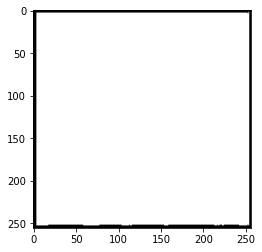

<Figure size 576x216 with 0 Axes>

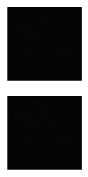

Epoch: 100 [D loss: 0.642558, acc.: 0.00%, op_acc: 61.33%] [G loss: 0.257601]
pf class 0 epoch 100 : %.2f 0.382720947265625


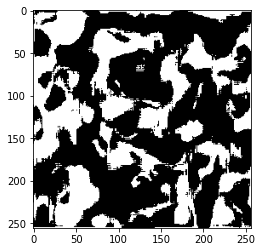

<Figure size 576x216 with 0 Axes>

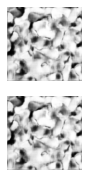

Epoch: 200 [D loss: 0.822490, acc.: 0.00%, op_acc: 12.89%] [G loss: 0.446749]
pf class 0 epoch 200 : %.2f 0.3373870849609375


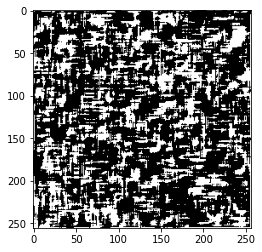

<Figure size 576x216 with 0 Axes>

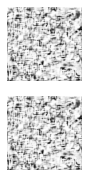

Epoch: 300 [D loss: 0.818224, acc.: 0.00%, op_acc: 6.64%] [G loss: 0.649283]
pf class 0 epoch 300 : %.2f 0.339630126953125


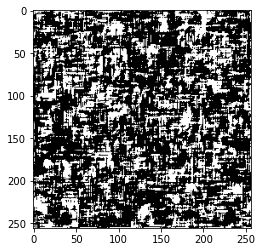

<Figure size 576x216 with 0 Axes>

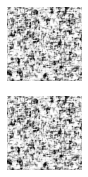

Epoch: 400 [D loss: 0.816792, acc.: 0.00%, op_acc: 6.64%] [G loss: 0.666624]
pf class 0 epoch 400 : %.2f 0.32586669921875


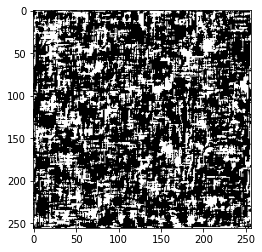

<Figure size 576x216 with 0 Axes>

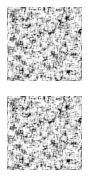

Epoch: 500 [D loss: 0.827581, acc.: 0.00%, op_acc: 4.30%] [G loss: 0.696844]
pf class 0 epoch 500 : %.2f 0.32464599609375


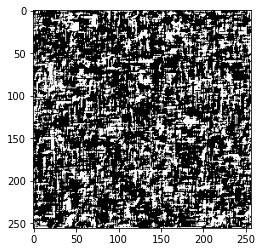

<Figure size 576x216 with 0 Axes>

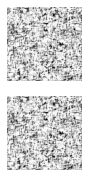

Epoch: 600 [D loss: 0.819448, acc.: 0.00%, op_acc: 4.30%] [G loss: 0.688356]
pf class 0 epoch 600 : %.2f 0.3018951416015625


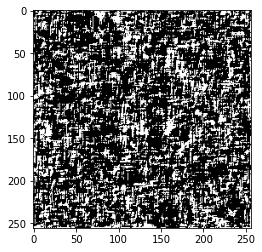

<Figure size 576x216 with 0 Axes>

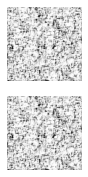

Epoch: 700 [D loss: 0.828851, acc.: 0.00%, op_acc: 3.91%] [G loss: 0.702448]
pf class 0 epoch 700 : %.2f 0.321868896484375


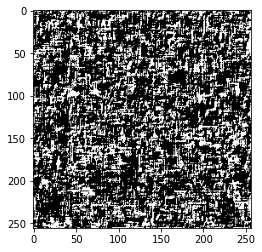

<Figure size 576x216 with 0 Axes>

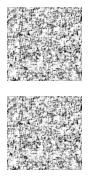

Epoch: 800 [D loss: 0.837186, acc.: 0.00%, op_acc: 1.95%] [G loss: 0.710687]
pf class 0 epoch 800 : %.2f 0.326141357421875


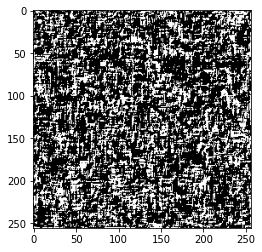

<Figure size 576x216 with 0 Axes>

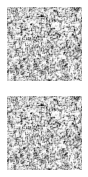

Epoch: 900 [D loss: 0.841332, acc.: 0.00%, op_acc: 1.56%] [G loss: 0.673201]
pf class 0 epoch 900 : %.2f 0.332733154296875


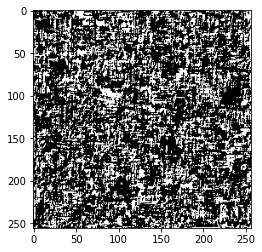

<Figure size 576x216 with 0 Axes>

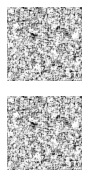

Epoch: 1000 [D loss: 0.841018, acc.: 0.00%, op_acc: 2.73%] [G loss: 0.681575]
pf class 0 epoch 1000 : %.2f 0.317413330078125


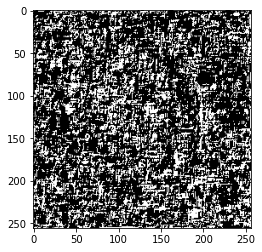

<Figure size 576x216 with 0 Axes>

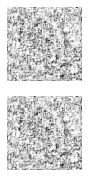

Epoch: 1100 [D loss: 0.850787, acc.: 0.00%, op_acc: 1.56%] [G loss: 0.674578]
pf class 0 epoch 1100 : %.2f 0.30206298828125


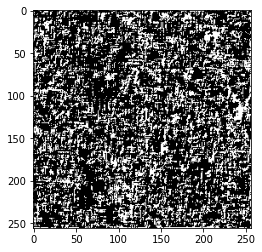

<Figure size 576x216 with 0 Axes>

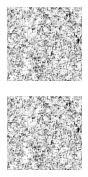

Epoch: 1200 [D loss: 0.837113, acc.: 0.00%, op_acc: 1.95%] [G loss: 0.703861]
pf class 0 epoch 1200 : %.2f 0.2867279052734375


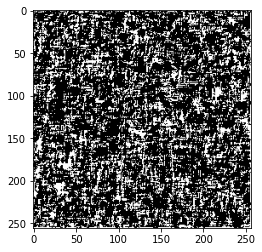

<Figure size 576x216 with 0 Axes>

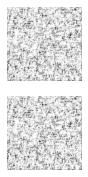

Epoch: 1300 [D loss: 0.843384, acc.: 0.00%, op_acc: 0.78%] [G loss: 0.681989]
pf class 0 epoch 1300 : %.2f 0.3370361328125


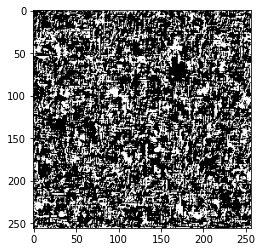

<Figure size 576x216 with 0 Axes>

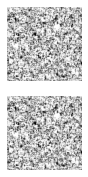

Epoch: 1400 [D loss: 0.853506, acc.: 0.00%, op_acc: 0.78%] [G loss: 0.690497]
pf class 0 epoch 1400 : %.2f 0.293182373046875


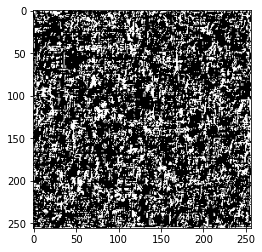

<Figure size 576x216 with 0 Axes>

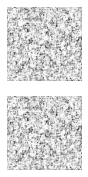

Epoch: 1500 [D loss: 0.843865, acc.: 0.00%, op_acc: 3.12%] [G loss: 0.672936]
pf class 0 epoch 1500 : %.2f 0.275665283203125


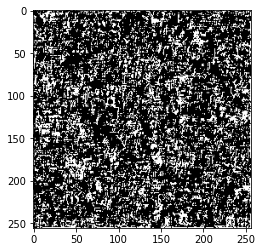

<Figure size 576x216 with 0 Axes>

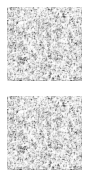

Epoch: 1600 [D loss: 0.841766, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.680353]
pf class 0 epoch 1600 : %.2f 0.2980499267578125


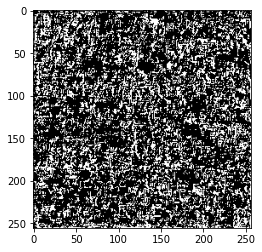

<Figure size 576x216 with 0 Axes>

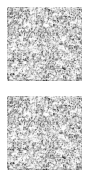

Epoch: 1700 [D loss: 0.847888, acc.: 0.00%, op_acc: 0.00%] [G loss: 0.675268]
pf class 0 epoch 1700 : %.2f 0.28985595703125


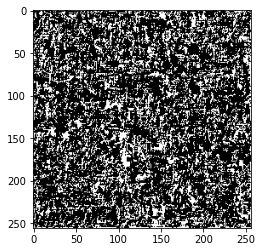

<Figure size 576x216 with 0 Axes>

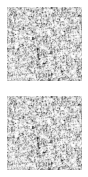

Epoch: 1800 [D loss: 0.842161, acc.: 0.00%, op_acc: 1.95%] [G loss: 0.672811]
pf class 0 epoch 1800 : %.2f 0.28070068359375


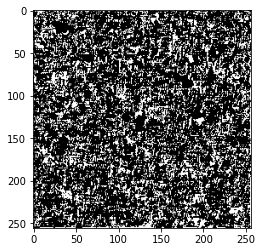

<Figure size 576x216 with 0 Axes>

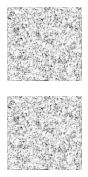

Epoch: 1900 [D loss: 0.864731, acc.: 0.00%, op_acc: 0.78%] [G loss: 0.676928]
pf class 0 epoch 1900 : %.2f 0.3124237060546875


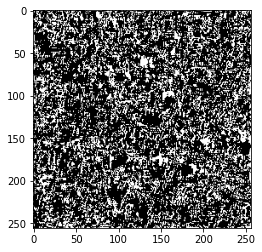

<Figure size 576x216 with 0 Axes>

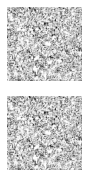

Epoch: 2000 [D loss: 0.843103, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.669883]
pf class 0 epoch 2000 : %.2f 0.274566650390625


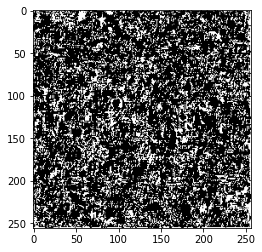

<Figure size 576x216 with 0 Axes>

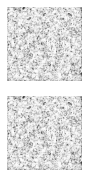

Epoch: 2100 [D loss: 0.850241, acc.: 0.00%, op_acc: 0.78%] [G loss: 0.669945]
pf class 0 epoch 2100 : %.2f 0.294464111328125


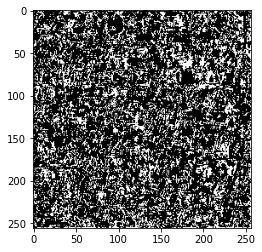

<Figure size 576x216 with 0 Axes>

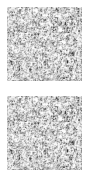

Epoch: 2200 [D loss: 0.838839, acc.: 0.00%, op_acc: 1.95%] [G loss: 0.666653]
pf class 0 epoch 2200 : %.2f 0.3103179931640625


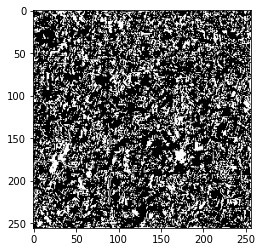

<Figure size 576x216 with 0 Axes>

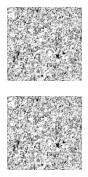

Epoch: 2300 [D loss: 0.852135, acc.: 0.00%, op_acc: 0.00%] [G loss: 0.657184]
pf class 0 epoch 2300 : %.2f 0.2809295654296875


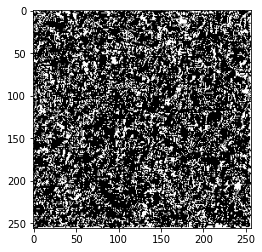

<Figure size 576x216 with 0 Axes>

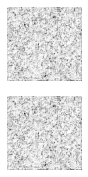

Epoch: 2400 [D loss: 0.841302, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.663964]
pf class 0 epoch 2400 : %.2f 0.2952728271484375


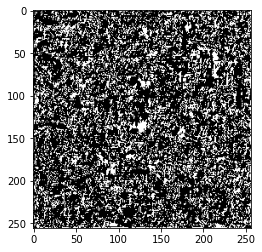

<Figure size 576x216 with 0 Axes>

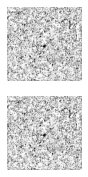

Epoch: 2500 [D loss: 0.839702, acc.: 0.00%, op_acc: 3.12%] [G loss: 0.677429]
pf class 0 epoch 2500 : %.2f 0.2993621826171875


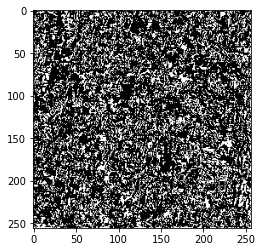

<Figure size 576x216 with 0 Axes>

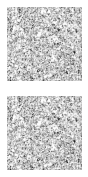

Epoch: 2600 [D loss: 0.854348, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.671656]
pf class 0 epoch 2600 : %.2f 0.3028106689453125


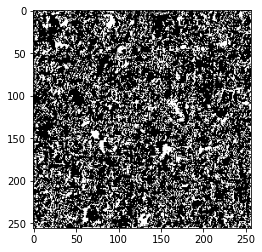

<Figure size 576x216 with 0 Axes>

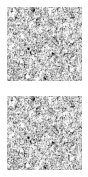

Epoch: 2700 [D loss: 0.840518, acc.: 0.00%, op_acc: 1.95%] [G loss: 0.668043]
pf class 0 epoch 2700 : %.2f 0.29998779296875


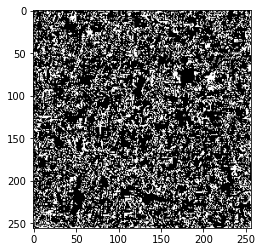

<Figure size 576x216 with 0 Axes>

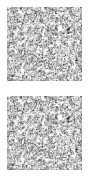

Epoch: 2800 [D loss: 0.847246, acc.: 0.00%, op_acc: 0.78%] [G loss: 0.668451]
pf class 0 epoch 2800 : %.2f 0.302276611328125


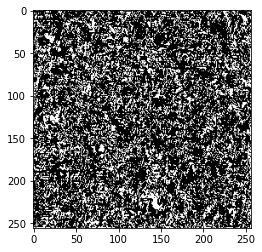

<Figure size 576x216 with 0 Axes>

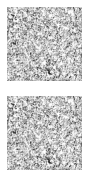

Epoch: 2900 [D loss: 0.844304, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.669257]
pf class 0 epoch 2900 : %.2f 0.27923583984375


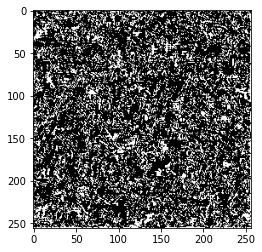

<Figure size 576x216 with 0 Axes>

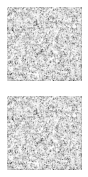

Epoch: 3000 [D loss: 0.845883, acc.: 0.00%, op_acc: 1.56%] [G loss: 0.675522]
pf class 0 epoch 3000 : %.2f 0.2779541015625


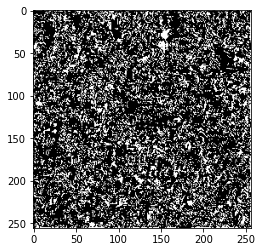

<Figure size 576x216 with 0 Axes>

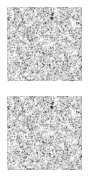

Epoch: 3100 [D loss: 0.846086, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.665557]
pf class 0 epoch 3100 : %.2f 0.28594970703125


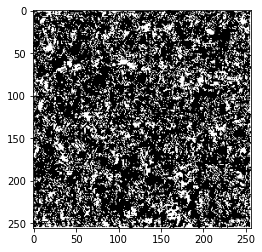

<Figure size 576x216 with 0 Axes>

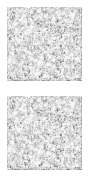

Epoch: 3200 [D loss: 0.826023, acc.: 0.00%, op_acc: 4.30%] [G loss: 0.660768]
pf class 0 epoch 3200 : %.2f 0.2846527099609375


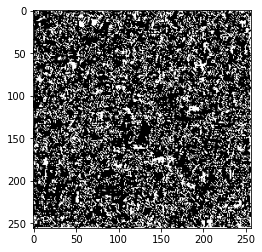

<Figure size 576x216 with 0 Axes>

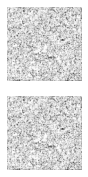

Epoch: 3300 [D loss: 0.839475, acc.: 0.00%, op_acc: 3.91%] [G loss: 0.662019]
pf class 0 epoch 3300 : %.2f 0.3059539794921875


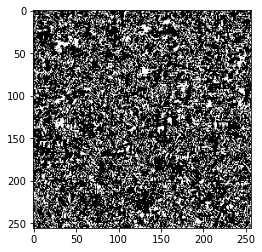

<Figure size 576x216 with 0 Axes>

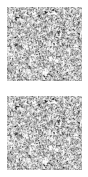

Epoch: 3400 [D loss: 0.836210, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.665081]
pf class 0 epoch 3400 : %.2f 0.2901458740234375


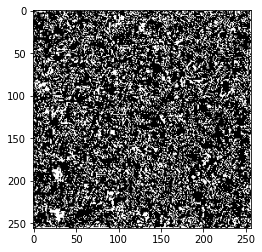

<Figure size 576x216 with 0 Axes>

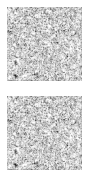

Epoch: 3500 [D loss: 0.844876, acc.: 0.00%, op_acc: 2.34%] [G loss: 0.672126]
pf class 0 epoch 3500 : %.2f 0.2839202880859375


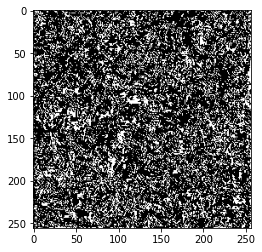

<Figure size 576x216 with 0 Axes>

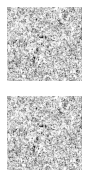

Epoch: 3600 [D loss: 0.831090, acc.: 0.00%, op_acc: 3.12%] [G loss: 0.678640]
pf class 0 epoch 3600 : %.2f 0.2827911376953125


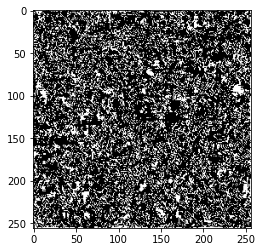

<Figure size 576x216 with 0 Axes>

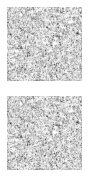

Epoch: 3700 [D loss: 0.820839, acc.: 0.00%, op_acc: 3.12%] [G loss: 0.687556]
pf class 0 epoch 3700 : %.2f 0.2909088134765625


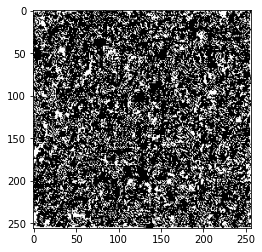

<Figure size 576x216 with 0 Axes>

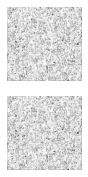

Epoch: 3800 [D loss: 0.837039, acc.: 0.00%, op_acc: 1.17%] [G loss: 0.667532]
pf class 0 epoch 3800 : %.2f 0.2813262939453125


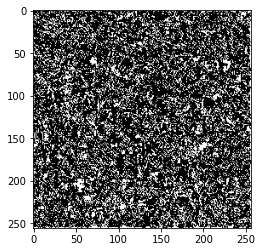

<Figure size 576x216 with 0 Axes>

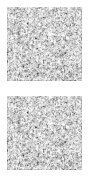

Epoch: 3900 [D loss: 0.854351, acc.: 0.00%, op_acc: 2.34%] [G loss: 0.663140]
pf class 0 epoch 3900 : %.2f 0.2858123779296875


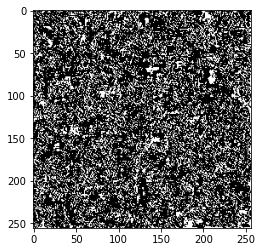

<Figure size 576x216 with 0 Axes>

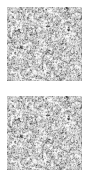

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.



SSIM: 0.23%

learning rate: 2.1e-04
num_dense_layers_gen: 1
num_dense_layers_dis: 1
num_dense_nodes_gen: 128
num_dense_nodes_dis: 128
n_critic: 3

(50, 256, 256)
(50, 256, 256, 1)
Epoch: 0 [D loss: 0.305500, acc.: 0.00%, op_acc: 50.00%] [G loss: -0.219895]
pf class 0 epoch 0 : %.2f 0.6653594970703125


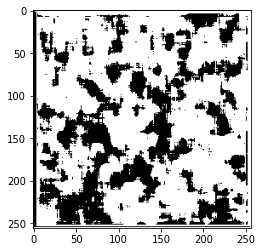

<Figure size 576x216 with 0 Axes>

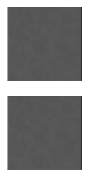

Epoch: 100 [D loss: 0.612199, acc.: 0.00%, op_acc: 86.33%] [G loss: 0.310721]
pf class 0 epoch 100 : %.2f 0.38165283203125


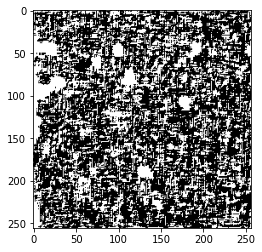

<Figure size 576x216 with 0 Axes>

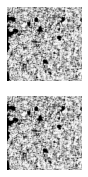

Epoch: 200 [D loss: 0.646579, acc.: 0.00%, op_acc: 67.58%] [G loss: 0.559412]
pf class 0 epoch 200 : %.2f 0.355255126953125


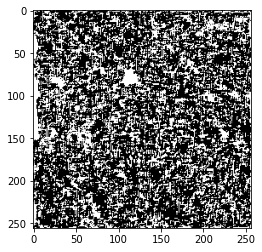

<Figure size 576x216 with 0 Axes>

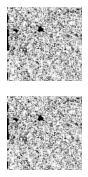

Epoch: 300 [D loss: 0.644997, acc.: 0.00%, op_acc: 78.91%] [G loss: 0.615577]
pf class 0 epoch 300 : %.2f 0.3737640380859375


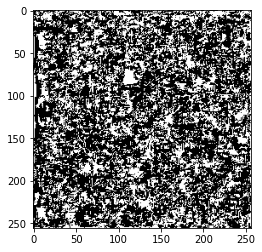

<Figure size 576x216 with 0 Axes>

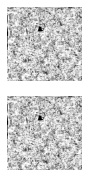

Epoch: 400 [D loss: 0.600158, acc.: 0.00%, op_acc: 89.06%] [G loss: 0.615345]
pf class 0 epoch 400 : %.2f 0.3099517822265625


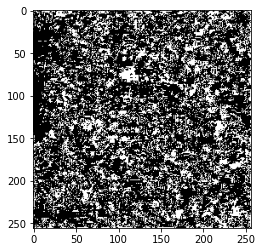

<Figure size 576x216 with 0 Axes>

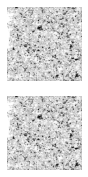

Epoch: 500 [D loss: 0.608123, acc.: 0.00%, op_acc: 91.41%] [G loss: 0.469123]
pf class 0 epoch 500 : %.2f 0.225067138671875


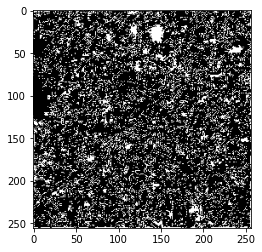

<Figure size 576x216 with 0 Axes>

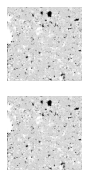

Epoch: 600 [D loss: 0.564173, acc.: 0.00%, op_acc: 89.84%] [G loss: 0.622237]
pf class 0 epoch 600 : %.2f 0.4241180419921875


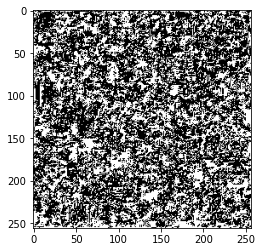

<Figure size 576x216 with 0 Axes>

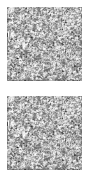

Epoch: 700 [D loss: 0.566439, acc.: 0.00%, op_acc: 80.86%] [G loss: 0.796416]
pf class 0 epoch 700 : %.2f 0.2344970703125


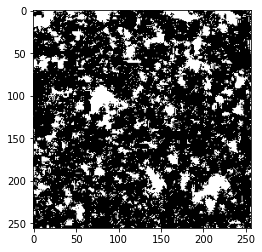

<Figure size 576x216 with 0 Axes>

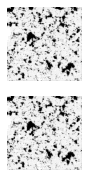

Epoch: 800 [D loss: 0.578380, acc.: 0.00%, op_acc: 80.08%] [G loss: 0.431656]
pf class 0 epoch 800 : %.2f 0.38616943359375


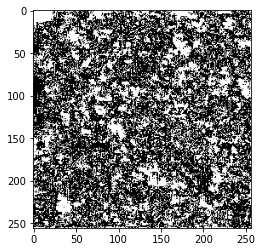

<Figure size 576x216 with 0 Axes>

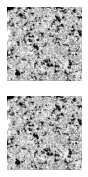

Epoch: 900 [D loss: 0.596221, acc.: 0.00%, op_acc: 85.55%] [G loss: 0.788110]
pf class 0 epoch 900 : %.2f 0.202178955078125


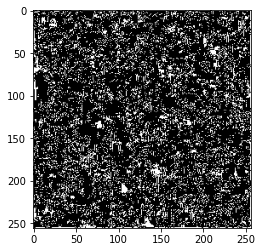

<Figure size 576x216 with 0 Axes>

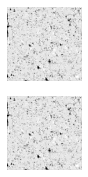

Epoch: 1000 [D loss: 0.428722, acc.: 0.00%, op_acc: 94.53%] [G loss: 1.185491]
pf class 0 epoch 1000 : %.2f 0.2310791015625


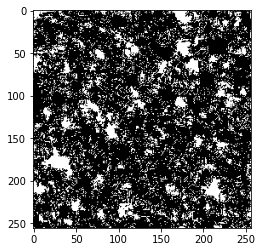

<Figure size 576x216 with 0 Axes>

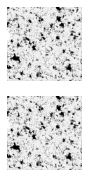

Epoch: 1100 [D loss: 0.576263, acc.: 0.00%, op_acc: 91.02%] [G loss: 0.417473]
pf class 0 epoch 1100 : %.2f 0.2142333984375


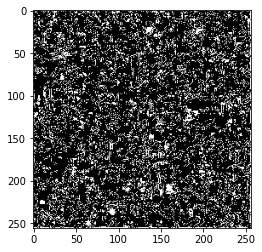

<Figure size 576x216 with 0 Axes>

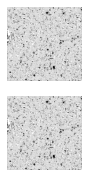

Epoch: 1200 [D loss: 0.557855, acc.: 0.00%, op_acc: 97.27%] [G loss: 0.473488]
pf class 0 epoch 1200 : %.2f 0.484375


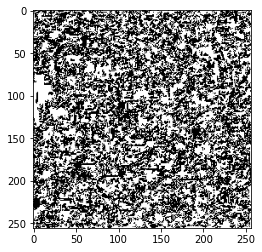

<Figure size 576x216 with 0 Axes>

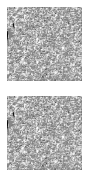

Epoch: 1300 [D loss: 0.558985, acc.: 0.00%, op_acc: 89.45%] [G loss: 0.628329]
pf class 0 epoch 1300 : %.2f 0.115081787109375


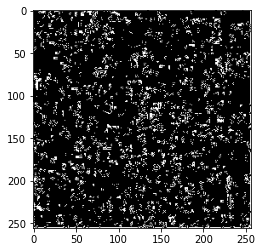

<Figure size 576x216 with 0 Axes>

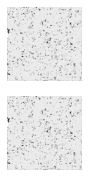

Epoch: 1400 [D loss: 0.517512, acc.: 0.00%, op_acc: 98.05%] [G loss: 0.835835]
pf class 0 epoch 1400 : %.2f 0.1318206787109375


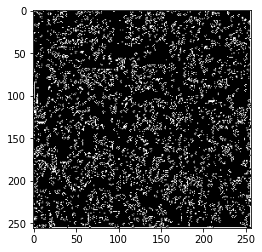

<Figure size 576x216 with 0 Axes>

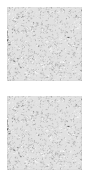

Epoch: 1500 [D loss: 0.546967, acc.: 0.00%, op_acc: 95.70%] [G loss: 0.475523]
pf class 0 epoch 1500 : %.2f 0.4407806396484375


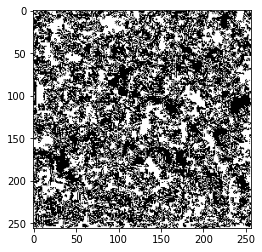

<Figure size 576x216 with 0 Axes>

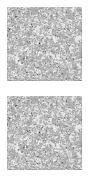

Epoch: 1600 [D loss: 0.528941, acc.: 0.00%, op_acc: 95.70%] [G loss: 0.725431]
pf class 0 epoch 1600 : %.2f 0.1815338134765625


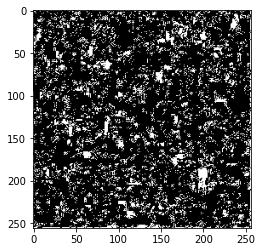

<Figure size 576x216 with 0 Axes>

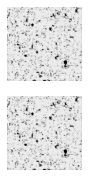

Epoch: 1700 [D loss: 0.520193, acc.: 0.00%, op_acc: 94.92%] [G loss: 0.692274]
pf class 0 epoch 1700 : %.2f 0.15203857421875


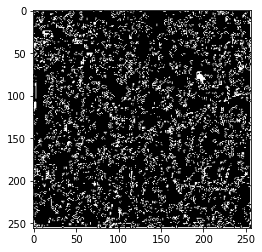

<Figure size 576x216 with 0 Axes>

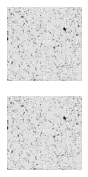

Epoch: 1800 [D loss: 0.357278, acc.: 0.00%, op_acc: 100.00%] [G loss: 0.699873]
pf class 0 epoch 1800 : %.2f 0.137451171875


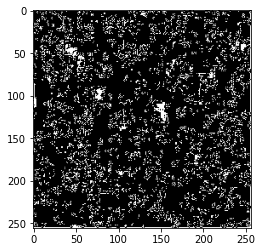

<Figure size 576x216 with 0 Axes>

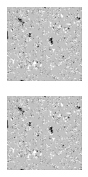

Epoch: 1900 [D loss: 0.367373, acc.: 0.00%, op_acc: 100.00%] [G loss: 0.885707]
pf class 0 epoch 1900 : %.2f 0.080718994140625


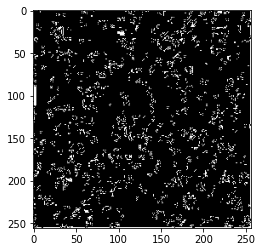

<Figure size 576x216 with 0 Axes>

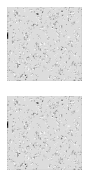

Epoch: 2000 [D loss: 0.344527, acc.: 0.00%, op_acc: 100.00%] [G loss: 0.559585]
pf class 0 epoch 2000 : %.2f 0.088958740234375


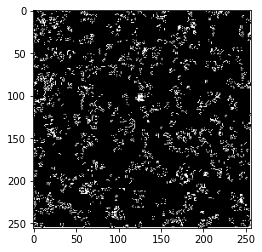

<Figure size 576x216 with 0 Axes>

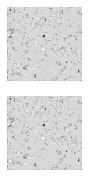

Epoch: 2100 [D loss: 0.465847, acc.: 0.00%, op_acc: 96.09%] [G loss: 0.101449]
pf class 0 epoch 2100 : %.2f 0.4731597900390625


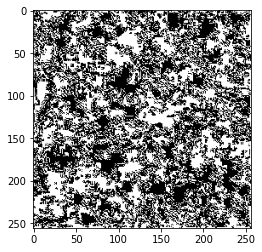

<Figure size 576x216 with 0 Axes>

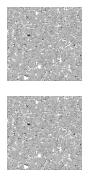

Epoch: 2200 [D loss: 0.303281, acc.: 0.00%, op_acc: 100.00%] [G loss: 0.639164]
pf class 0 epoch 2200 : %.2f 0.0842437744140625


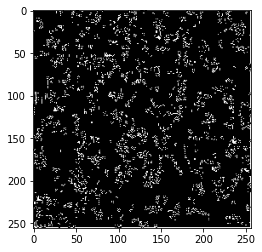

<Figure size 576x216 with 0 Axes>

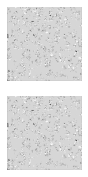

Epoch: 2300 [D loss: 0.183910, acc.: 0.00%, op_acc: 100.00%] [G loss: 1.078253]
pf class 0 epoch 2300 : %.2f 0.0550689697265625


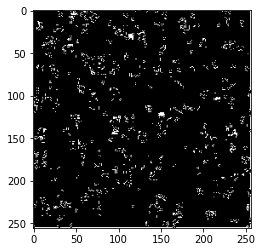

<Figure size 576x216 with 0 Axes>

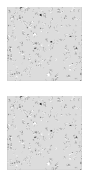

In [ ]:
search_result = gp_minimize(func=fitness,
                            dimensions=dimensions,
                            acq_func='EI', # Expected Improvement.
                            n_calls=40,
                            callback = [checkpoint_saver])
                     

In [ ]:
4.2e-5, 0 ,1, 212, 347, 3

In [ ]:
!pip install pyfftw

In [ ]:
!pip install pymks

In [ ]:
X = np.concatenate((X_train[0], X_train[49]))

In [ ]:
from pymks.datasets import make_microstructure

X_1 = make_microstructure(n_samples=1, grain_size=(25, 25))
X_2 = make_microstructure(n_samples=1, grain_size=(15, 95))


In [ ]:
from pymks import pymks.stats
from pymks import PrimitiveBasis
from pymks.stats import correlate

#prim_basis = PrimitiveBasis(n_states=2, domain=[0, 1])
#X_ = prim_basis.discretize(X)
X_corr = correlate(X, periodic_axes=[0, 1])

In [ ]:
para = {
    'gen_neuron': [128, 256, 512],
    'dis_neuron': [128, 256, 512],
    'lr': [0.01, 0.001, 0.005, 0.0005, 0.0002, 0.0001],
    'n_critic': [1, 3, 5],
    'gen_block_5': [0, 1],
    'dis_block_5': [0, 1]
}

In [ ]:
def opt_func(X_train, y_train, params):
    tf.keras.backend.clear_session()
    gen_neu = int(params['gen_neuron'])
    dis_neu = int(params['dis_neuron'])
    lr = float(params['lr'])
    dis_block_5 = int(params['dis_block_5'])
    n_critic = int(params['n_critic'])
    gen_block_5 = int(params['dis_block_5'])
    model = ACGAN(64, 64, 1, 1, lr, gen_block_5, gen_neu, dis_block_5, dis_neu)
    model.train(X_train, y_train, n_critic, 8000, 100)
    score = model.compare_output()
    print('ssim: ' + score)
    return score

In [ ]:
verbose = 1
fit_with_partial = partial(opt_func, X_train, y_train, verbose)

In [ ]:
pbounds = { 'lr' : [0.0001 , 0.001], 
           'n_critic' : [3, 5],
           'gen_neu' : [128, 256, 512],
           'dis_neu' : [128, 256, 512],
           'gen_block_5' : [0,1],
           'dis_block_5' : [0 , 1]}





In [ ]:
optimizer = BayesianOptimization(
    f=fit_with_partial,
    pbounds=pbounds,
    #verbose=2,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    #random_state=1,
)

optimizer.maximize(init_points=10, n_iter=10)


for i, res in enumerate(optimizer.res):
    print("Iteration {}: \n\t{}".format(i, res))

print(optimizer.max)

ValueError: ignored

In [ ]:

#input dimensions
input_rows = 256
input_cols = 256
input_channels = 1
input_classes = 7
n_critic = 5

In [ ]:
fashion_acgan = ACGAN(input_rows, input_cols, input_channels, input_classes,2.4e-05, 0, 482, 0, 371)

In [ ]:
new_GAN = ACGAN(input_rows, input_cols, input_channels, input_classes, 5e-05, 1, 128, 1, 128, 100)

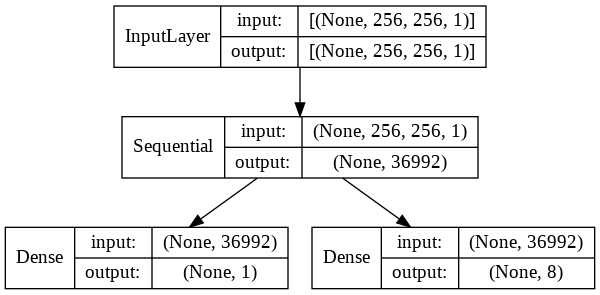

In [ ]:
plot_model(new_GAN.discriminator, show_shapes=True, show_layer_names=False)

In [ ]:
!unzip /content/2D_Phase_50-20201226T052850Z-001.zip

Archive:  /content/2D_Phase_50-20201226T052850Z-001.zip
  inflating: 2D_Phase_50/Class_7/vol_data.txt  
  inflating: 2D_Phase_50/Class_3/41.txt  
  inflating: 2D_Phase_50/Class_7/47.txt  
  inflating: 2D_Phase_50/Class_3/42.txt  
  inflating: 2D_Phase_50/Class_7/42.txt  
  inflating: 2D_Phase_50/Class_7/46.txt  
  inflating: 2D_Phase_50/Class_3/43.txt  
  inflating: 2D_Phase_50/Class_3/vol_data.txt  
  inflating: 2D_Phase_50/Class_7/45.txt  
  inflating: 2D_Phase_50/Class_7/48.txt  
  inflating: 2D_Phase_50/Class_7/49.txt  
  inflating: 2D_Phase_50/Class_7/43.txt  
  inflating: 2D_Phase_50/Class_7/39.txt  
  inflating: 2D_Phase_50/Class_7/44.txt  
  inflating: 2D_Phase_50/Class_3/40.txt  
  inflating: 2D_Phase_50/Class_7/41.txt  
  inflating: 2D_Phase_50/Class_3/38.txt  
  inflating: 2D_Phase_50/Class_7/38.txt  
  inflating: 2D_Phase_50/Class_3/46.txt  
  inflating: 2D_Phase_50/Class_3/49.txt  
  inflating: 2D_Phase_50/Class_3/45.txt  
  inflating: 2D_Phase_50/Class_7/40.txt  
  inflat

In [ ]:
y_train

array([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.])

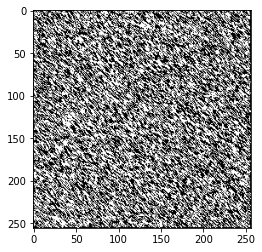

In [ ]:
X_train, y_train = read_many_disk(0, 0, 0, 0, input_classes, 7)

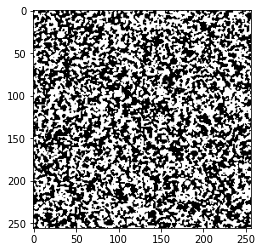

In [ ]:
X_train, y_train = read_many_disk(0, 0, 0, 0, input_classes)

In [ ]:
store_array(c1, 'test')

In [ ]:
c1 = read_store_data('/content/2D_Phase_50/Class_1/1.txt')

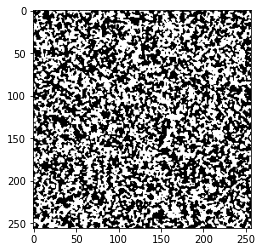

In [ ]:
plt.imshow(c1, cmap= 'gray')

In [ ]:
compare_image(c1, c2, 'crop')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


ValueError: ignored

In [ ]:
c2.shape

(237, 234)

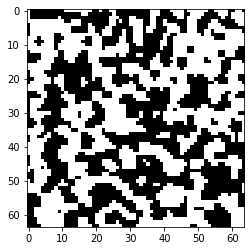

In [ ]:
c2 = random_crop(c1, 64, 64)
plt.imshow(c2, cmap = 'gray')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


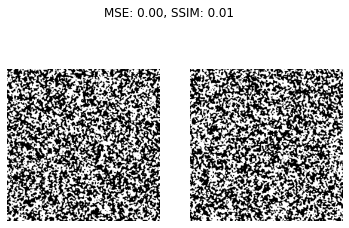

In [ ]:
compare_image(X_train[0], X_train[1049], "")

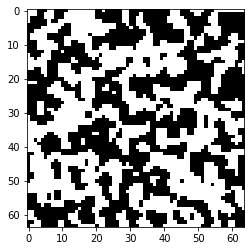

In [ ]:
plt.imshow(X_train[199], cmap= 'gray')

In [ ]:
X_train.shape

NameError: ignored

(50, 256, 256)
(50, 256, 256, 1)
Epoch: 0 [D loss: 0.693131, acc.: 0.00%, op_acc: 50.00%] [G loss: 0.692882]
pf class 0 epoch 0 : %.2f 0.0693359375


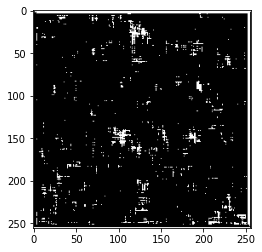

Epoch: 100 [D loss: 0.348938, acc.: 0.00%, op_acc: 100.00%] [G loss: -1.542388]
pf class 0 epoch 100 : %.2f 0.2930755615234375


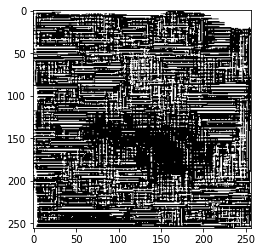

Epoch: 200 [D loss: -0.673786, acc.: 0.00%, op_acc: 100.00%] [G loss: -0.368059]
pf class 0 epoch 200 : %.2f 0.34124755859375


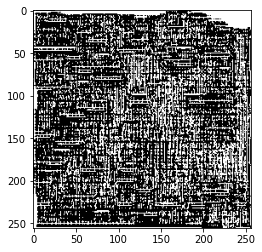

Epoch: 300 [D loss: -1.222441, acc.: 0.00%, op_acc: 100.00%] [G loss: -2.664321]
pf class 0 epoch 300 : %.2f 0.4202880859375


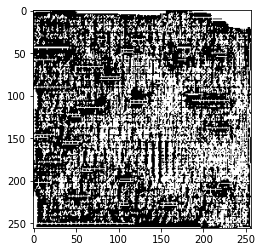

Epoch: 400 [D loss: -1.440138, acc.: 0.00%, op_acc: 100.00%] [G loss: -7.524899]
pf class 0 epoch 400 : %.2f 0.4516754150390625


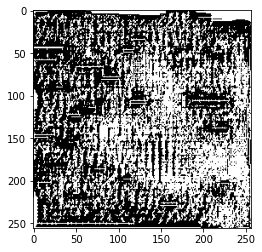

Epoch: 500 [D loss: -0.957976, acc.: 0.00%, op_acc: 100.00%] [G loss: -13.595535]
pf class 0 epoch 500 : %.2f 0.4758758544921875


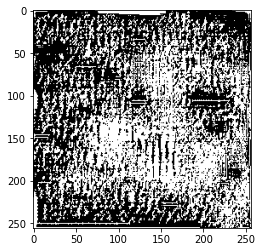

Epoch: 600 [D loss: -1.144726, acc.: 0.00%, op_acc: 100.00%] [G loss: -15.781869]
pf class 0 epoch 600 : %.2f 0.47821044921875


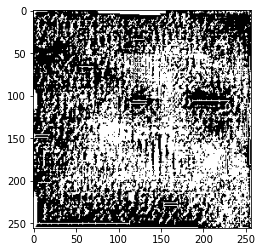

KeyboardInterrupt: ignored

In [ ]:
g_loss, d_loss = fashion_acgan.train(X_train, y_train, epochs=8000, batch_size=128, sample_interval=100)

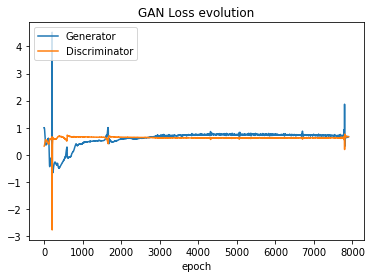

In [ ]:
  #Show the Generator-Descriminator loss for every epoch
def plot_gan_losses(g_loss, d_loss):
    plt.plot(g_loss[100:])
    plt.plot(d_loss[100:])
    plt.title('GAN Loss evolution')
    plt.ylabel('')
    plt.xlabel('epoch')
    plt.legend(['Generator', 'Discriminator'], loc='upper left')
    plt.show()
plot_gan_losses(g_loss, d_loss)

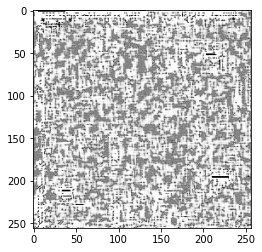

<Figure size 720x720 with 0 Axes>

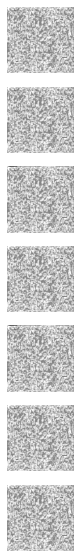

In [ ]:
fashion_acgan.sample_images(0, convert=0, smp_rows=7, smp_cols=1, save_img=False, fig_size=(10, 10))

In [ ]:
from scipy.interpolate import interp1d
# draw interpolated samples between two arbitrary points
def show_interp_samples(point1, point2, N_samples_interp, input_classes):
    #pick N_samples_interp + 2 points (one is the start, noise_1, and the other the end, noise_2)
    N_samples_interp_all = N_samples_interp + 2
    N_labs = input_classes
    plt.figure(figsize=(11,11))
    plt.plot([N_labs, N_samples_interp_all, (N_samples_interp_all * N_labs) + 1])
    
    #fit a line between point1 and point2
    line = interp1d([1, N_samples_interp_all], np.vstack([point1, point2]), axis=0)
    
    #for every label
    for lab in range(input_classes):
        #draw N_samples_interp_all samples from the fitted line
        for i in range(N_samples_interp_all):
            ax = plt.subplot(N_labs, N_samples_interp_all, 1 + (i + (lab*N_samples_interp_all)))
            plt.axis('off')
            fashion_acgan.sample_single_image(line(i + 1).reshape((1, 100)), lab, convert = 0)

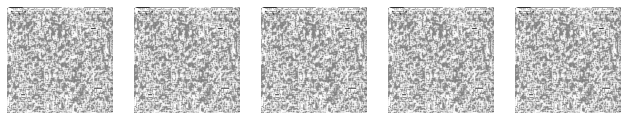

In [ ]:
#np.random.seed(seed=42)
#get a random point
noise_1 = np.random.normal(0, 1, (1, 100))
#draw samples between that point, and that same point with all coordinates scaled by -1
show_interp_samples(noise_1, -noise_1, 3, input_classes=1)


In [ ]:
id_label_sample = 0
#yet another noise sample
yan = np.random.normal(0, 1, (1, 100))
img_smp = fashion_acgan.generator.predict([yan, np.array(id_label_sample).reshape(1, )])[0, :, :, 0]
img_smp = img_smp*0.5 + 0.5

array([[8.5599730e-01, 9.4493210e-01, 9.5547044e-01, ..., 4.2124406e-01,
        8.0406570e-01, 6.8513630e-01],
       [7.0115423e-01, 9.1734153e-01, 9.7680960e-01, ..., 7.9036330e-01,
        6.9832650e-01, 8.0711970e-01],
       [5.7195413e-01, 5.7906870e-01, 7.6634496e-01, ..., 8.7534940e-01,
        8.2076540e-01, 9.5855200e-01],
       ...,
       [1.1920929e-07, 8.4161760e-05, 8.7959310e-01, ..., 9.3352413e-01,
        9.9307480e-01, 9.9214890e-01],
       [2.3272634e-04, 1.1920929e-07, 3.4750910e-02, ..., 7.9418194e-01,
        9.7425090e-01, 9.2770094e-01],
       [5.9528320e-02, 5.5074690e-05, 1.1920929e-07, ..., 3.2060890e-01,
        8.5234620e-01, 8.3628947e-01]])

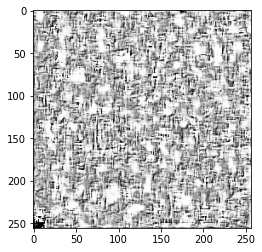

In [ ]:
read_store_data('unconditional-class1.txt')

In [ ]:
store_array(img_smp, 'unconditional-class1')

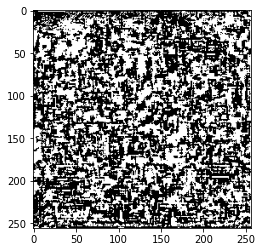

In [ ]:
plt.imshow(convert_image(img_smp), cmap = 'gray')

In [ ]:
img_smp

array([[0.        , 0.        , 0.        , ..., 0.96434414, 0.9821069 ,
        0.75518817],
       [0.        , 0.        , 0.        , ..., 0.9964974 , 0.9932294 ,
        0.7282282 ],
       [0.        , 0.        , 0.        , ..., 0.9956128 , 0.9930969 ,
        0.63896513],
       ...,
       [0.54106486, 0.5533682 , 0.5425399 , ..., 0.6289706 , 0.6629604 ,
        0.723718  ],
       [0.536518  , 0.71732897, 0.61480427, ..., 0.5931486 , 0.8035511 ,
        0.67789924],
       [0.5261959 , 0.50014395, 0.62797976, ..., 0.6559796 , 0.77322304,
        0.7084334 ]], dtype=float32)

In [ ]:
img_smp = img_smp.reshape((1,256,256))
img_smp = np.expand_dims(img_smp, axis = 3)

In [ ]:
X_train1 = np.expand_dims(X_train, axis =3)
X_train1.shape

img_smp.shape

(1, 256, 256, 1)

In [ ]:
def plot_n_closest(img_smp, id_label_sample, X_train, N_closest, fig_size=(8, 3)):
    #get the images that belong to id_label_sample
    idx_lab = np.where(y_train==id_label_sample)
    X_lab = (X_train[idx_lab, :, :].astype(np.float32) / 255)[0, :, :, :]
    
    #apply the norm between X_lab and the sampled image across all images
    L1d = np.sum(np.apply_along_axis(np.linalg.norm, -1, X_lab - img_smp, ord=1), axis=1)
    idx_l1_sort = L1d.argsort()
    #plt.imshow(X_lab[idx_l1_sort[0], :, :], cmap='gray')
    fig, axs = plt.subplots(1, N_closest, figsize=fig_size)
    for i in range(N_closest):
        axs[i].imshow(X_lab[idx_l1_sort[i], :, :], cmap='gray')
        axs[i].axis('off')
    plt.show()

In [ ]:
from sklearn.neighbors import NearestNeighbors


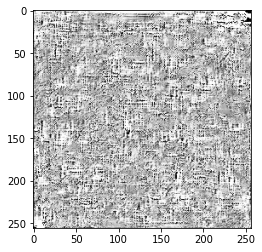

In [ ]:
plt.imshow(img_smp, cmap='gray')

In [ ]:
store_array(img_smp, 'generated_no_threshold')
store_array(convert_image(img_smp), 'generated_with_threshold')
store_array(c1, 'real')

In [ ]:
plot_n_closest(img_smp, 6, X_train, 5, fig_size=(8, 8))

ValueError: ignored

In [ ]:
thres = filters.threshold_mean(img_smp)

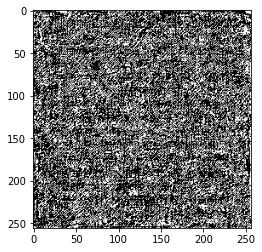

In [ ]:
plt.imshow(convert_image(img_smp), cmap= 'gray')

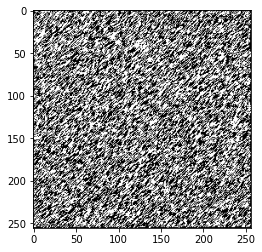

In [ ]:
plt.imshow(X_train[-1], cmap = 'gray')

In [ ]:
ssim(Y, X_train[-1])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.005981732243034246

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


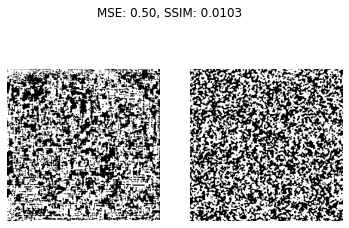

In [ ]:
compare_image(Y, X_train[49], '')

In [ ]:
thres = 0.85

0.54052734375


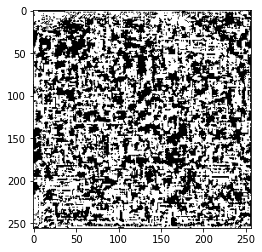

In [ ]:
thres = filters.threshold_mean(img_smp)
Y = []
for i in range(img_smp.shape[0]):
  for j in range(img_smp.shape[1]):
    if img_smp[i, j] > thres:
      Y.append(1.0)
    else:
      Y.append(0.0)
Y = np.asarray(Y)
Y = Y.reshape((256,256))
plt.imshow(Y[:, :], cmap = 'gray')
print(np.sum(Y)/(256*256))

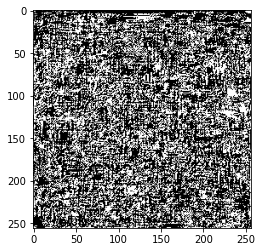

In [ ]:
plt.imshow(convert_image(img_smp), cmap = 'gray')

In [ ]:
np.sum(Y)/(256*256)

0.623870849609375

In [ ]:
np.sum(convert_image(img_smp))/(256*256)

0.4136962890625

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


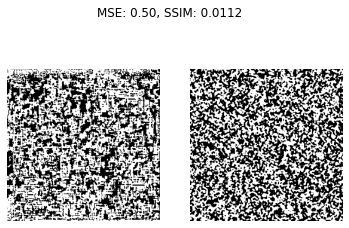

In [ ]:
compare_image(Y, X_train[0], "")

In [ ]:
store_array(Y, "class1_3000")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


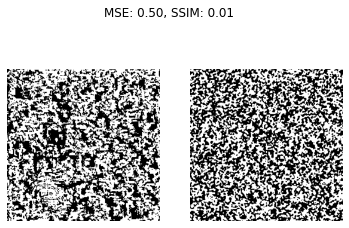

In [ ]:
compare_image(Y , X_train[49], "Generated vs Real")

In [ ]:
def find_phase_fraction(Y):
  return np.sum(Y)/(np.shape(Y)[0] * np.shape(Y)[1])

In [ ]:
print(check_quality(Y))
print(find_phase_fraction(Y))


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


0.03650870636402449
0.5380859375


In [ ]:
!wget https://www.google.com/imgres?imgurl=https%3A%2F%2Fi.guim.co.uk%2Fimg%2Fmedia%2Ffe1e34da640c5c56ed16f76ce6f994fa9343d09d%2F0_174_3408_2046%2Fmaster%2F3408.jpg%3Fwidth%3D1200%26height%3D900%26quality%3D85%26auto%3Dformat%26fit%3Dcrop%26s%3D0d3f33fb6aa6e0154b7713a00454c83d&imgrefurl=https%3A%2F%2Fwww.theguardian.com%2Fscience%2F2019%2Fjun%2F17%2Fhow-dogs-capture-your-heart-evolution-puppy-dog-eyes&tbnid=zt4uNhWr-q4O7M&vet=12ahUKEwix1faR4NfuAhVDfn0KHSsJBzUQMygCegUIARDSAQ..i&docid=WdQJYRL3o17gHM&w=1200&h=900&q=dog&hl=en-US&ved=2ahUKEwix1faR4NfuAhVDfn0KHSsJBzUQMygCegUIARDSAQ

--2021-02-07 12:16:02--  https://www.google.com/imgres?imgurl=https%3A%2F%2Fi.guim.co.uk%2Fimg%2Fmedia%2Ffe1e34da640c5c56ed16f76ce6f994fa9343d09d%2F0_174_3408_2046%2Fmaster%2F3408.jpg%3Fwidth%3D1200%26height%3D900%26quality%3D85%26auto%3Dformat%26fit%3Dcrop%26s%3D0d3f33fb6aa6e0154b7713a00454c83d
Resolving www.google.com (www.google.com)... 108.177.12.106, 108.177.12.103, 108.177.12.105, ...
Connecting to www.google.com (www.google.com)|108.177.12.106|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.google.com/imghp [following]
--2021-02-07 12:16:02--  https://www.google.com/imghp
Reusing existing connection to www.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘imgres?imgurl=https:%2F%2Fi.guim.co.uk%2Fimg%2Fmedia%2Ffe1e34da640c5c56ed16f76ce6f994fa9343d09d%2F0_174_3408_2046%2Fmaster%2F3408.jpg?width=1200&height=900&quality=85&auto=format&fit=crop&s=0d3f33fb6aa6e0154b7713a0045

In [ ]:
img = cv2.imread('download(3).jpg')

In [ ]:
img = Image.open('/content/download (3).jpg')

In [ ]:
img = np.asarray(img)

In [ ]:
from PIL import Image

In [ ]:
np.shape(img[64:128][64:128][:])

(0, 259, 3)

In [ ]:
plt.imshow(newarr)

NameError: ignored

In [ ]:
img.shape

(194, 259, 3)

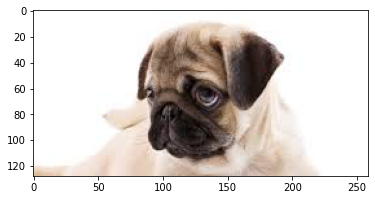

In [ ]:
plt.imshow(img[0:128][0:128)

In [ ]:
img3 = np.fliplr(img2)

In [ ]:
ssim(np.fliplr(X_train[49]), X_train[49]) 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.014960112421871202

In [ ]:
mean_squared_error(img2, img3)

ValueError: ignored

In [ ]:
ssim(img2, img3, multichannel=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.10301802782096058

In [ ]:
img1 = img[0:64, 0:64]

img1.shape
img2.shape

(64, 64, 3)

In [ ]:
ssim(img1, img2, multichannel=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.29206516618165485

In [ ]:
new

array([[[265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.],
        ...,
        [265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.]],

       [[265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.],
        ...,
        [265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.]],

       [[265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.],
        ...,
        [265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.]],

       ...,

       [[265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.],
        ...,
        [260., 264., 265.],
        [260., 264., 265.],
        [260., 264., 265.]],

       [[265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.],
        ...,
        [265., 265., 265.],
        [265., 265., 265.],
        [265., 265., 265.]],

       [[265., 265., 265.],
        [265., 265., 265.],
        [265., 2

In [ ]:
new = img + 10.0 * np.ones(img.shape)

ValueError: ignored

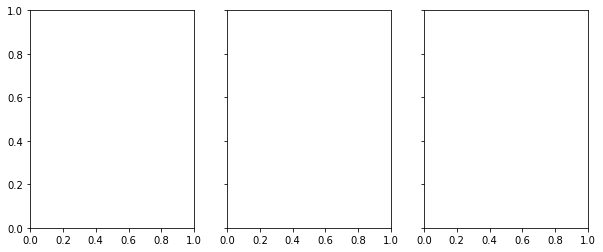

In [ ]:
rows, cols = img.shape[0], img.shape[1]

noise = np.ones_like(img) * 0.2 * (img.max() - img.min())
noise[np.random.random(size=noise.shape) > 0.5] *= -1

img_noise = img + noise
img_const = img + abs(noise)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4),
                         sharex=True, sharey=True)
ax = axes.ravel()

mse_none = mean_squared_error(img, img)
ssim_none = ssim(img, img, data_range=img.max() - img.min())

mse_noise = mean_squared_error(img, img_noise)
ssim_noise = ssim(img, img_noise,
                  data_range=img_noise.max() - img_noise.min())

mse_const = mean_squared_error(img, img_const)
ssim_const = ssim(img, img_const,
                  data_range=img_const.max() - img_const.min())

label = 'MSE: {:.2f}, SSIM: {:.2f}'

ax[0].imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[0].set_xlabel(label.format(mse_none, ssim_none))
ax[0].set_title('Original image')

ax[1].imshow(img_noise, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[1].set_xlabel(label.format(mse_noise, ssim_noise))
ax[1].set_title('Image with noise')

ax[2].imshow(img_const, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[2].set_xlabel(label.format(mse_const, ssim_const))
ax[2].set_title('Image plus constant')

plt.tight_layout()
plt.show()

In [ ]:
newarr = img + 10 * np.ones(img.shape)

In [ ]:
ssim(newarr, img, multichannel=True, data_range= np.max(newarr)- np.min(img))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.9966875816476332

In [ ]:
ssim(img[0:64][0:64][:], img[1:65][1:65][:], multichannel=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


ValueError: ignored

In [ ]:
ssim(img, img, multichannel=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


1.0

In [ ]:
!wget data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxISEhUSExMWFhUXGBcXGBgWGBoYGhYXGhoXGBUXGBgZHSggGBolGxgYITEhJSkrLi4uGB8zODMtNygtLisBCgoKDg0OGxAQGi0lHyUtLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLf/AABEIAOEA4QMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAAAAwQFBgcBAgj/xAA9EAABAwIDBQUGBAUEAwEAAAABAAIRAyEEBTEGEkFRYXGBkaHwEyIyscHRB0Lh8SMzUmKCFHKSoiSywsP/xAAZAQADAQEBAAAAAAAAAAAAAAAAAgMBBAX/xAAkEQACAgICAgMBAQEBAAAAAAAAAQIRAyESMTJBBBMiYVGBQv/aAAwDAQACEQMRAD8A2tCEJBgQuoQAIQhaAIQhAAhCEACFxdQAIQhAAhCEACEIQAIQhAAhCEACEIQAIQhAAhCEACEIQBxdXF1YAIQhaAIQhAAhCEAcKbYnHMp/EQEjmuZtotlyzXaLP/auMWHq6jPJWkPCF9lzx22FFhge92d6jzt23g3zWYvxZJXkPJJUuUv9KcYmrUtuGnVngU9o7Y0CLhwKybCuPlPaD9QnO8SYBPPw/SUc5L2HBGq09rcORckdyXpbTYZ3547VneKyh1Ju+TMkAdhaHE+CiTihPO1uzRb9kg+tGz08zouEio096WbiWHRw8VibsU+DB5+vJeKWYVGgEuMxMJvtkL9aNz3l2VkWA2vrMj3pHI9Vbcj2vFQhrxBTLKvYrxv0XBC803giV6VhAQhCABCEIAEIQgAQhCABCEIAEIQgDi8ufC9Eqt7VZu2izW/T9kk5cUbFWTVfHMaLuHiqnnG1bp3WQqDis5c4klxPQlNKmPcdQb+C55SlIsopEzmWaOeTLj2KAr1y4wfH6Lj3k3I7132c/EPDxkJUqGCnhuvI9/3S7HMgz69XTatUAGvYdJHJI1Ks8Ytcdefit7AdPxW7oeP7/KUYLHFr5m7TvCObfegdoBHeomtWNuN04wLd8OH5hftAIPyn0FtGWbFUpNrUxTiRDgegMi3IiFmOcObSrvYDYD3TzvEgcBbyVywmZmmwmbzUJPRpZbwd5LJM2xrnVN5xuYP1MchJKyOzXosJxV++PsnMtdx5/ZVxmLjcJ4wT3TPzCeUcUNOpJ6C8Dvsm4mWSraQBty/b11S7CWkQe/5lN6OItfw49Es1oJnXpwCw0vuyO0mlN5toCeHar2x4IkGVhtKsWnkPWiuuy+0ZEMcfd628U0J8dPoSUL2i/oTWhjWP+EgpyCuhSTItUdQhC0AQhCABCEIAEIQgAXCUKA2tzcUKJO8QSLQllLirNStkftXthTw4LGmX9LwscznaJ9ZxL3E+u1eM7zJ7yXSST6lV6u+barn72yvXRK4evvaO7j9jcKXw8xcwfEFQOW4YGLT3THcrAIAiFsgQpMa+WhSGIxNrHs/WUjWqxYfVNK9YcWkHmPqOKWhrEsRiHaeSbvxR15fL90o2m93w+92cQOI6rlTBucHACHNbvi3xttvW/qAvHRbaRlMSOImY46eu8p1lOPLHgjn+hHhKhKrouPXFL0KtwRqHAjxlNQtmjYjGNdgatRszPs3DlIhxHTeIKzioN651+fr6K/bOboovB+FwqPI5sFif+I8SqBjGezAE34dJ0HzSw9jSF3VJcOQafATPnPgvVPEEvcTcNJJ6mSGhMxU3d89IHd9ynFBpjc4/EernGB91ShLJKhjiDrpqVM4LMARccv3PJQWIwLqe6CDJ942NpHuN6ugk9/ROKO834/djhqRbjwBSaY+0TtXEl1gBHif2XtlYtvPr7KKo1nReGt4b1p+/aU7ZWkevQS0aWjI85cHgb26NCTaB0WpZfiGOaIeCvnipiSx36/OVo/4f5/P8M7s9sEjtJWx/LFl+kaaELzTfIXpdSIghCEACEIQAIQhAHlyyz8UcaCQybDXr91p+KqbrSeQJWA/iBmUvMmSZPVQyu2kUhrZVq2I3nWsOJJ17uATSu+TG8AkKR1J7h9e3qlsHRbvCbnlCVR2bZO5NhxEhxPefkU/rujQ/NGCbDbAR/b+wSNYydQlfY66Gz2OJm8L02ncCBHOfpvEBNsZiI4wkcvxIa8ODjbqPXmsldaBVZoGQ7PizzE6iPrz7VL4jJ6bodEOEi3UQR3i3gveRVw+mHAz6809rVde0fNeLPLNyuz04wjVGK59gPZVnM4A/SVGURz9RIVk23qh2Jd67FXQ0gweg/Ve5ibcE2eVkVSaRdtm6v/ivcRYU6g7nEh3/ALA9ypePfvP6NI16CJ/5SrNkNf8AhVGcmOJ/yLQB8vBVZgv6vomj2wk9I6TBjs+UeuxWvYbLRVqmbwQ7sAkR5hVNrryrz+Gxh7r8AD1vJ+qn8iTjjbQ+BJzSNIbljACYG8SSSQCZ+io+02T06Tt+TJ6E63JJB+IlaGx1vuqhtnjgxse0DSNI4c+C8zDkkpI7ckE0ylljXaA/8b98yl8PTI5x65JhTxU23pnmdU+w1Ug6+X1XqnAI5jTcNA2O0ykcnx5o1Wu0gjiNOoiFL5lRBZN45A28FV69S9hAC3tGH0xkGLFSk1wgyBcafopRZp+EmcOfTNF992C08Y4grS1XG9E5rYIQhUFBCEIAEIQgCB2xxO5Qj+ox3alfOe19cmqV9EbaUpozyPrzhfN+0/8AOcOq5n5sr/4I2honuCqNB08Z+XFaF+GGwlHG4SpWrEgl5Yzd4BoEnxPkq/ttsw3A1Q1j3O43AHyJ+ibowe0CNyY4coUfVNiT3dU5yt5dTM8PXBM8xfDeP3U/ZQjHOGr/AATfEZiAI9mI6TPbMJyzDOqMdVt7se7yadZ6wr1iKuGp4egyjSa5waxznFsgvj3g6db6joqaEIbZLaP2Y3Hk7rvhk682zzVpxucsawku+8X5LP8ALNnHO32SSYkQNCPzOvYcJvchRePxdb+W5xgD9PoFx5fhxlK0dGP5LjGmGZYw1arnzqUiz15JKm3Tx8k4aIHX9/suxKlRzN27JPKKkNrE6lpFuYFvr4KMe2Hd/wB/sFIZXYOM2ue34Y7fzJtiaZBvMiAZ6CB4fII9m+hs7p1+ysOxeYijXhxgH9R9VBNEkDv+q5UkQQlyQU4uLNhLi7NpfmzGtLy4RBOvBZnneYNrVC928B+UQTI5kcEZNTrYsspSS0GT3Sb9E52fyOnWqluJG6SXAkGIcD4Qo/H+KoO2VzfI5KkQ4Y0DeY6eY0I7lI4F8rztDknsMU+lSJcGgO4fCQDB8fIJTLGB1xzgjr91eSolFkzimE0rRPMiVUqlR0kH5q2421OBHf8ANVCuXAnQjx8wUtaNb2XT8J8yDcUGz8QLSPMWW8tNl8obMZiaOLp1Bwe0kd919WYaoHNDhoQD4qmPTJy6FEIQrCAhdXEACEIQBEbVN/8AGqHoPmF8ybS/z3jkV9R57S38PVb/AGHyv9F840ciqY3H+wpi73mT/S0fE49AFCS/Y68TZfwgwhp5ZSJ/O6o/uLt0eTVCfitk7i3209I1Wk5dgmUKLKNMQym1rG9jRA71UttsKahaLxPHRbl0jYbZlmXU3MpX46apLFUgbO1WgZnkG7RvcxwgfJZ/i3GVzQnyLyjxIzDv9mXAj3SIcOnPtR/qRG6HEt4TII72kF3fKXrMkSVE1mkX0CuiTJfA5oaUkuO6RBboHcQLRoVAYiXuLucn6r2Rvdnq6c0cPIj1PcbIMGDWH165r02/eP1j5p9Vwt9L8Y+vJOcDhA6J+KePDSe0a3RYUPdm8AHiHakk34QLeaQzvBEOLhcHQ9sgdbwrhs/kbiQHA6DTi4cSf93ySe1OUuaN2A0bwk9JBEdN6Qk5/opx0Z4aR+57Zt5r0WT68/XJSjcI4H3m/vp66R3cqYflHjpwk6/IKtk6ObOZkcPUmSJBAIP724KS/wBc9z9+QCeUAO5EhzSoOvhoA5DjB+yKVQn3TqEWFEwxxb7So501amp1twvHySmSYMgl37FMMLhTzsp/AWgcOo07krZqR6zWjvMgDgefASs+xAa02B8VsIyB72ttvNJ4Hn2lY1j6TmPcwiC1xBHIgkFLGVmyVDfDvioO30F9Z7J4j2mEoP502+MXXySDLl9Ufh2Zy/D/AOwKsfJE30WVCEKogIQhAHEIQgDjhIhVzZrZSlhatWsBL32nk3WB2n5BWRCyldhYKLzehvAToCDqpRROdvLQHTxFvRuky+LGh5Efm7P4RHRYxm7Ie7tOvNbZjBv0j1HrVZBnuBLXu+LWdOHWLELz8eps7J7iQdMEW5jkm2OpgmAIaOdz42kp+xt/QhPMPljn3AtzPFdLklsiotkVgMA592i+gCsWDyEhskieIiY53U3lOWCmy4ueHLknrqDj0HLS3FcWT5LbpHZj+OkrZU6uVkukGTwIt8vXYpnIMgqbw923Igx4yp3Ltny9wduhoB53/dXTDUGtEBXg3JEZpJjTL8v9kwCJMapPOcpFVhECTz4xz8/FS3tQECoCq8UTtmX43Zh8m0XNuF5OnaTxUczKi1xaRaOIidPFa++k02MKCzXIGOO80AO5xMd+qWSkkNGrMzxuSOaC5onj29yr9fBQQQDbT7LUauXuFjoe79ioDMMkIJgWNx0KlizO6kUyYtWitRATzK27z2t1M8VzEM3bHUevBSuzOEL6zRPVdEnqznitmnZXhoYwFo4aWWFfi7k/+nx9Uge7UIqD/O5/7SvobBUoAHJU38XNknYyiKtITUpg2/qbrHzW44/izMkrkfOtFt19U/h4wjL8ODrueRJI+a+a8syp76raQad4kCIv4L6rybCexoU6X9DGt8AAqx3Ik+h4hdQqiHEIQgDiEIWGghC4gAe8ASdFnm2Wf7whpIHD72UrthngZ/Db/l9lm2Y4wvmT2Lmyzt0i+OFbZp2z2LFSg33t4x2eWqh9pcuaZO4J6/oFB7A5qASwuJvpy7OSveOpB7Z1XFlTX/DqhTMkZlj3PhoAvx0ibkde1XLDYMNaOvTgLBP3YYN0AXomez1K5smZz0dGPFx2NWMUjhMucbxbl9U3y0bzz6tzVk+EQE+DGpbZmafHSI2liC03gNHq8aJOpn1NpubKv7UZx7KRNid0E8CoTFkup7562nx7l1Qs55NIsOfZ8HgezqbvlP6LuWbR0wd1xM2ufXqVmOIzQB0Fxt4LtHFNEO3/AF3qv1Psn9pt1HM6T4M6c/mpB+IBIi6y/Z3ECpbejt9ditOR50DV9iRcAQe3VDbXZip9Fpfhg4TCgsywkOFuKs7DZRObi6TPBcbHwzfKjOdo8s3HyJIJns74Vg2MyyCH+EefapKvgw9wJA71JUGtosmI7LKcMjkqGnBLZN4VLvZII5qo7O7UNfUNJxMk+7PHoreCvRxNOJw5E0yMw+Q0G1TWFNoefzACY0+Sk0ITpJdCttghCFpgIQhAHlCELDQSWLrBjHOPASlVX9r8buUt0G7vkEs5VGzYq2Z1tRjpc50xJVPqYqOM9hT7PsSXOieNlXMRiYPucPzcSen9I7L/ACXJFHS9FhyOqadVrz7jRBkuDJ6An7rWsmzinVaBvhxjhceJ1WBMrSL3PrXmrLsfnBp1WtFpIBMxbQSY06JckdWNCXo1XMKQBgT3GE1cRED0E5zEOIBbcxwUZhGEOIebn1wXkyT5M9KPiOcE0h1h68FZeCrtBnvAypis47hIPBdnxdRZzZ9tGfbeg1A5oFgCoF+dxhWtAlxAk8jAt4q4ZsGnekXMz+pWU7Q5YWkhjiG8QDblMfZdWFp6Zz5VWxpj2uqGYAPzXmjSfzS2By72Q/mb+9ECCAPHUqRoUd7eDYBghpOm9Fp711Wc9E3sdiQx0PBvoY0KtmzGC3sTUrg2Lot0AaZ7wVlmV5dWFfd9qSZgkGQbcCfBbHs3hhRYxoNhqoZmkVxKy8ULAKKzGrLz0T5tawUbjKZk8LFSzv8AOimFfrYnhTfooHbDO2EezY64se2xHz+ancupuHxXHUeis02oLTiHgu3SDxjd8Rp3jvUPjqyuZ0xXC4gkh7XHeGuo81rGy2cDEUxNnNsb+ax3L/dlt566ft3q1bD5l7OuGE2db7LshLjI5Zq0aohcBXV2nMCFxdQAIXEIA4hC4sAFQNvMR/E3ZEBvmVfysw25eBUqO7gO5QzvRXF2ZlmVSXFRb2nQDr2DmeAHapHHOMkqMxVTQA2se081NFGeYDTrJ5DQdpUxkdDee1+81oDh8Ri/BreBKhA0Bu87U/COfUnlPilsdXc1wbwbIA7yCT1MT9oCP4Yv9PomnUDqTTIggXBmewqGxLQ14IHef1uoTYHaFtbDim4w5gju4XPrwUzmFee4efABebli+VM78bVWO6NUAgnT1opwPG6qng67gQDc8enRTFOtYQqYXx0LkXIh87w4cSRw9QFRc8woJkq842XGQba/qeihcVkzqlgPLxVsbp2TmrRRDR3fe5Lxgi4gTadT81bc0yltIH2hHEBrbns6d6a4HLAR7nvCLgfEOdvqr/YiP1nvIcthwd17v3WlZNhGm/NUzB4N7XADTsj1+qt2VVTbXkpOSbtlFGloszWBR2ZfOyfMqWUHisRNTU/Qrc24mY/IfueKVJz+ABPgsezTMKWJe5xHs371natd0dN2nrcdmquP4g7R+xptpNuXH3o1AjhIInodQVnRpj+ZTMs0e3+mdJabhp4G8G0nUmKNKzMjJXBv9mfZvEAcOLSeLfUHzTvB1TSrNdNpkHpKjqVSSxrjEAAHi3iAekQCOHjLtzocWHWC4dCLnxAPgE7FN3wdXeY13MA+KWVb2Cx/tcM0E3b7v2VkXZB3E5ZKmCEITGAhCEAeUIQsA45ZF+IWNBqGL3K1nEEBpJMCFiG2FQGqY0kwufN2kVxlPrnndR9Y6p5iyeijatU6RJ6WSDtidXEmXOAvw/t7OoEAckiGF0SenmTfxS7KJnr0SOJfu2hMv4KTWFxBZugPLA2HEji53wMt0A0/uK0nC4wupMc4++RYOgSREuIOkTxuskr1y5lMC0NJPUyQP+oaO4q57PtgHfI3Wblho0DmRqXGTHNynkhaKQlTLzlOCqFscSbnjHIcuEn7XslHAFojh6lQmzmaQAHEyLXbN+Qib636cFccPVDhJU4wTKObRX6+G3bhs31P2Xg4cvHvE9gMduitDqYKQrNDRoseJr2b9qfoqjdnmG26Y63XW5GxjgQFY3VobIATelm1Mv3CIOo7IE+ZCOH9N5/wZ08C4xytr0T3DYPdvHikswzxtIxFvrMQq1mu1LgHRUbBI3STuiDNpIIFxF+NpC1QoVzsuh0uQqjtRmzMMA4EEuLmwD/SPe7CBMd3NULMtrajXgF1Vjmn4N4OE9dDeI42eq9UxJIe0uLvfBG8ZI+KY7t0HsHRU4X2JyroksZXdVa5r3Fz90vaf62iCDf8wG+OyRwvGYOo5jt5pNvkbEHoQue23W2kEER0Gp8w3xKSrVIdLRYgOHCOY7AZHcqJaEbLBhfeqQIGhB4EESA4cDB1H6p7mNUh44GN09wjh0IURganvAiBAA7YAB81N47BlxbUB1+aT2P6NE/C4n2T+W8I8Lq9qpfh3Q3cPfi6fkraunF4nPk8gQhCoICEIQB5QhCwBOqLFYXtnPtXd+i3DH1d2m48gViG09QOqO5rmy+SLY+inYhvio2ra6lcUCo2tBWGsTo1CR7xj69ya4ho6+uqWEAyZPYuPh0mABp38B5E9yZdmHij7xBNmjiT8vXGVoGzjm7sNgNF7WAvDSSbudYx2Kn/AOmaHActenFwtxAnz6K4bNYaBumwILnEajT3W9YaG9pHYsltGx7LpsxlJAD3D3nEkTwbbdBHA9FdqFKAAozJoDQAAA0C3kB4BTFM3SRXsaTFYSVdshOISdbRO1oVPZFHQhVTMSRWLxrSa4iPzQCfGZ8FbSLqAz3C7vvDQ28ZHmT5LmLlKxOcGvTe18tc0AgzYu3gJ5g3g895QGIx8Sx4Jb8bTxk6wRYgi3a3qYc5rScwuGmpd2flPdY/4qArOLj1vbzIHbr2roikRYlihxa8uYLNBN28he4CQYeWqDU962nJJVGkG3FOKOKVU8fXcl6bJt4dEjh2zrZP6LOOvZf5XCxs1Id4YGQAr/keVe3YG8jKpGDHitF2FxUVQ0xcefRSkrKJ0aFlOEFKm1g4D909XG6Lq7IqlRyN2wQhCYAQhCAPCEJtj8Y2kwvdoEjdGkdtTig2kWzBKybHZa9xLgN6eMOjutKl9pdo31XQ0+EG3AC/0SWU4x5hr3gdwHlA+S4sk3do6scUlRSMzwFQT/Dd/wAfrqoPEAjUFbXXy5j238eaq+b7IMddjiT3AeASR+QumNLC/RmJcnGCguAPC59efcpbMtnajCenIfMlNaWTVoswxckwbjkOa6FJNEXFpnj/AFLd4bvIx4kucerjFuwKz7PYgtaC743QWg3DWzYkcYgHqXQqbVw9RpNoPy6p6/FkAG93QQOLQLN5+8T/ANVtAmahhNpW05aDOrjxL3wYHYAJ745K+5VWLmtJ1gE9pErEMpwz3VGbwMv3o6A2t4nwC2zJGQwdgSex/RLEpOqV7BSNROxEM6guEniKLXshw9BLVreuqb4uuGtnkJ+f2USpn34g4RlJhcPic0gdYIdPdbxWZ46tDmuFpYx3fEfQK8be441qwA0Yx47ySJ8lQiN6CbCwHSNB4AqsNInPsTot3j67U8DN5sRcG31C8wGONpiLeCDVEwD+o/Ke2D5JxT1VaLRKcYRINdNoUlgMueeQHCTdY2kaiQwTVP5TVcx7SDolci2fLoMb3eAB91MYzAVKIgU5H9ogAdsyVBzT0iqiaTllffptdzATpRGzVffoMPSPBSy7YO4o5JKmdQhCcwEIQgDwqxt3/JHahCjl8R4dmU0P5p7T8lOYX7/IIQuHIdcSyD4AmFTUoQuNnQiKx/w/5BNMZpU7PqhC6MRKZUcR8J7AorE6s7ChC7YnMzQcl/m0u7/1C1LLvhHrguISLsd9D5uiTfxQhOxENMXxUbmX0P1QhSZVdGOYz4v8P/0UF+Tvb/8ASEK6IsSxX/y35JDiPXBCFopJ4DXuH0VmwP8ANYhCjMrE0nKtApXG/D3FCFz4/ZaY82W/lH/c5TYXUL0cXijiyeTBCEKogIQhAH//2Q==

--2021-02-07 12:23:13--  ftp://data/image/jpeg
           => ‘jpeg’
Resolving data (data)... failed: No address associated with hostname.
wget: unable to resolve host address ‘data’
/bin/bash: base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxISEhUSExMWFhUXGBcXGBgWGBoYGhYXGhoXGBUXGBgZHSggGBolGxgYITEhJSkrLi4uGB8zODMtNygtLisBCgoKDg0OGxAQGi0lHyUtLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLf/AABEIAOEA4QMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAAAAwQFBgcBAgj/xAA9EAABAwIDBQUGBAUEAwEAAAABAAIRAyEEBTEGEkFRYXGBkaHwEyIyscHRB0Lh8SMzUmKCFHKSoiSywsP/xAAZAQADAQEBAAAAAAAAAAAAAAAAAgMBBAX/xAAkEQACAgICAgMBAQEBAAAAAAAAAQIRAyESMTJBBBMiYVGBQv/aAAwDAQACEQMRAD8A2tCEJBgQuoQAIQhaAIQhAAhCEACFxdQAIQhAAhCEACEIQAIQhAAhCEACEIQAIQhAAhCEACEIQBxdXF1YAIQhaAIQhAAhCEAcKbYnHMp/EQEjmuZtotlyzXaLP/auMWHq6jPJWkPCF9lzx22FFhge92d6jzt23g3zWYvxZJXkPJJUuUv9KcYmrUtuGnVngU9o7Y0CLhwKybCuPlPaD9QnO8SYBPPw/SUc5L2HBGq09rcORckdyXpbTYZ3547VneKyh1Ju+TMkAdhaHE+CiTihPO1uzRb9kg+tGz08zouEio096WbiWHRw8VibsU+DB5+vJeKWYVGgEuMxMJvtkL9a

In [ ]:
ssim(c1, c1, multichannel=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


1.0

In [ ]:
plt.imshow(Y[0:64, 0:64], cmap = 'gray')

In [ ]:
ssim(Y[0:64][0:64], Y[64])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


1.0

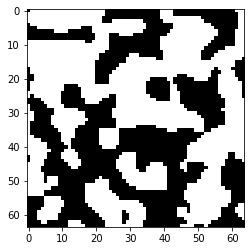

In [ ]:
plt.imshow(c1[0:64, 0:64], cmap = 'gray')

In [ ]:
img5 = Image.open('/content/download (3).jpg')

In [ ]:
img5 = img5.convert('1')

In [ ]:
imgarr = np.asarray(img5)

In [ ]:
imgarr.shape

(194, 259)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


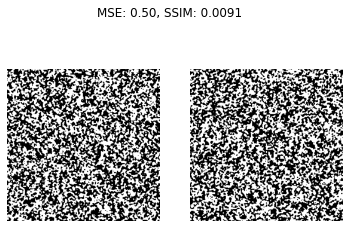

In [ ]:
compare_image(X_train[0], X_train[49], '')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


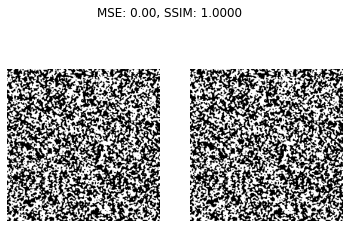

In [ ]:
compare_image(X_train[0], X_train[0], "")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


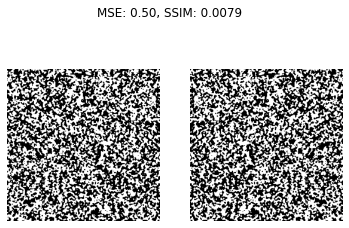

In [ ]:
compare_image(X_train[0], np.fliplr(X_train[0]), "flipped")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


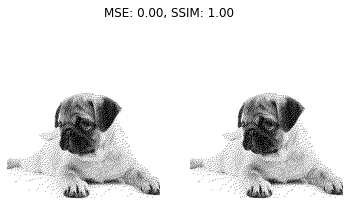

In [ ]:
compare_image(imgarr, imgarr, "flipped")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


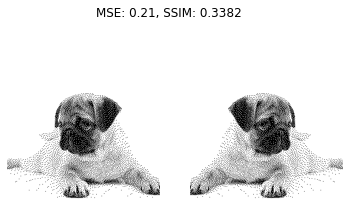

In [ ]:
compare_image(imgarr, np.fliplr(imgarr), "flipped")

In [ ]:
def compare_image(imageA, imageB, title):
    #m= mse(imageA, imageB)
    #imageA = tf.convert_to_tensor(imageA, 'float32')
    s= ssim(imageA, imageB, multichanel = True)
    fig= plt.figure(title)
    plt.suptitle("MSE: %.2f, SSIM: %.4f" % (mse(imageA, imageB), s))    
    
    # show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(imageA, cmap = plt.cm.gray)
    plt.axis("off")
    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(imageB, cmap = plt.cm.gray)
    plt.axis("off")
    
    plt.show()
def mse(imageA, imageB):
    err= np.sum((imageA.astype("float") - imageB.astype("float32")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
mean_squared_error(Y, X_train[49])

0.4976043701171875

In [ ]:
np.sum(Y)/(256*256)

0.5383758544921875

In [ ]:
ss = []
for i in X_train:
  ss.append(ssim(Y, i, multichannel= True))
max(ss)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  This is separate from the ipykernel package so we can avoid doing imports until


0.04061083960714358

In [ ]:
from scipy.stats import pearsonr
def find_pearson_coeff(y):
  pr = []
  for i in X_train:
    pr.append(pearsonr(np.ndarray.flatten(y), np.ndarray.flatten(i))[0])
  return pr

In [ ]:
max(find_pearson_coeff(Y))

0.028362762141193577

In [ ]:
pearsonr(np.ndarray.flatten(np.fliplr(imgarr)), np.ndarray.flatten(imgarr))

(0.2940521812084427, 0.0)

In [ ]:
len(ss)


1050

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


Epoch 63 +  ssim: 0.08213938394467464
Epoch 63 +  ssim: 0.013069923787292485
Epoch 63 +  ssim: 0.02052030987671631
Epoch 63 +  ssim: 0.027270027607756403
Epoch 63 +  ssim: 0.040403339107243925
Epoch 63 +  ssim: 0.0399028792117727
Epoch 63 +  ssim: 0.022324929885381796
Epoch 63 +  ssim: 0.030211486275920213
Epoch 63 +  ssim: 0.04146145069061381
Epoch 63 +  ssim: 0.07314851001429419
Epoch 63 +  ssim: 0.08573735627572597
Epoch 63 +  ssim: 0.00765129779380775
Epoch 63 +  ssim: 0.009958502622638971
Epoch 63 +  ssim: 0.08975030680333324
Epoch 63 +  ssim: 0.08770260933375272
Epoch 63 +  ssim: 0.06147645064545022
Epoch 63 +  ssim: -0.01786680136702807
Epoch 63 +  ssim: 0.011519578379732217
Epoch 63 +  ssim: 0.037399550320587525
Epoch 63 +  ssim: 0.0854886221145887
Epoch 63 +  ssim: 0.08150657966268068
Epoch 63 +  ssim: 0.025103387072997998
Epoch 63 +  ssim: 0.10389086019887261
Epoch 63 +  ssim: 0.01500925431876062
Epoch 63 +  ssim: 0.014221934359543251
Epoch 63 +  ssim: 0.0674032791312708
Epoc

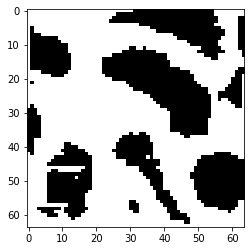

In [ ]:
ss = []
for i in range(0, 8000, 100):
  fashion_acgan.generator.load_weights('/content/single' + f'{i}generator_weights.hdf5')
  id_label_sample = 0
  #yet another noise sample
  yan = np.random.normal(0, 1, (1, 100))
  img_smp = fashion_acgan.generator.predict([yan, np.array(id_label_sample).reshape(1, )])[0, :, :, 0]
  img_smp = img_smp*0.5 + 0.5
  Y = []
  for i in range(img_smp.shape[0]):
    for j in range(img_smp.shape[1]):
      if img_smp[i, j] > thres:
        Y.append(0.0)
      else:
        Y.append(1.0)
  Y = np.asarray(Y)
  Y = Y.reshape((64,64))
  plt.imshow(Y[:, :], cmap = 'gray')
  j = c1[0:64, 0:64]
  s = ssim(Y, j, nultichannel = True)
  ss.append(s)
  print('Epoch ' + f'{i} +  ssim: ' + f'{s}')




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


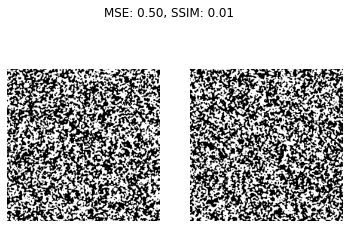

In [ ]:
compare_image(X_train[49], X_train[0], '')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


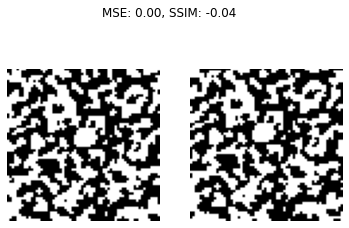

In [ ]:
compare_image(X_train[49][0:64, 0:64], X_train[49][2:66, 2:66], "")

In [ ]:
max(ss)

0.12714048634265362

In [ ]:
np.mean(ss for i in ss> 0 )

TypeError: ignored

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


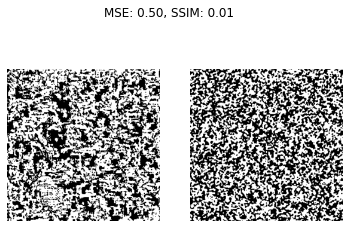

In [ ]:
compare_image(Y, X_train[49], " ")

In [ ]:
c1 = np.expand_dims(c1, axis =0)
c1 = np.expand_dims(c1, axis =3)

In [ ]:
X_train.shape[0]

202500

In [ ]:
ssim(Y, X_train[49], data_range= np.max(Y) - np.min(X_train[49]))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.003544035199892663

In [ ]:
check_quality(c2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  after removing the cwd from sys.path.


0.101896094786864

In [ ]:
store_array(Y, 'class1_2700')

In [ ]:
mse(Y, X_train[49])

0.4976043701171875

In [ ]:
fashion_acgan.generator.load_weights('/content/single3000generator_weights.hdf5')
fashion_acgan.discriminator.load_weights('/content/single3000discriminator_weights.hdf5')

In [ ]:
fashion_acgan.discriminator.predict(img_smp)

In [ ]:
new_GAN.generator.load_weights('/content/single7900generator_weights.hdf5')

ValueError: ignored

In [ ]:
find_phase_fraction(X_train[49])

0.49932861328125

In [ ]:
img2 = cv2.imread('/content/download (4).jpg', 0)

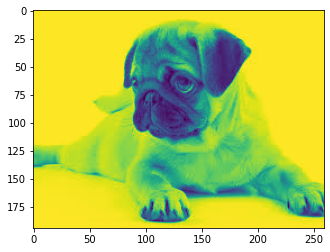

In [ ]:
plt.imshow(img)

In [ ]:
img = cv2.imread('/content/download (3).jpg', 0)
hist = cv2.calcHist([img, img], [0], None, [256], [0,256])

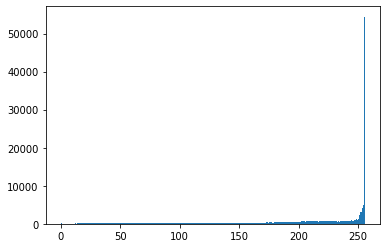

In [ ]:
plt.hist(img.ravel(),256,[0,256]); plt.show()

In [ ]:
hist

array([[2.1000e+01],
       [8.0000e+00],
       [1.1000e+01],
       [3.0000e+00],
       [3.0000e+00],
       [4.0000e+00],
       [1.0000e+01],
       [9.0000e+00],
       [1.2000e+01],
       [1.2000e+01],
       [1.6000e+01],
       [2.3000e+01],
       [2.3000e+01],
       [1.5000e+01],
       [2.4000e+01],
       [3.1000e+01],
       [3.0000e+01],
       [2.8000e+01],
       [3.2000e+01],
       [4.9000e+01],
       [5.1000e+01],
       [6.3000e+01],
       [7.3000e+01],
       [7.0000e+01],
       [9.4000e+01],
       [7.9000e+01],
       [7.9000e+01],
       [9.3000e+01],
       [1.0300e+02],
       [6.7000e+01],
       [7.6000e+01],
       [9.6000e+01],
       [8.0000e+01],
       [9.2000e+01],
       [7.3000e+01],
       [6.5000e+01],
       [1.0400e+02],
       [1.0500e+02],
       [7.9000e+01],
       [9.2000e+01],
       [9.1000e+01],
       [8.3000e+01],
       [8.9000e+01],
       [9.6000e+01],
       [7.9000e+01],
       [7.9000e+01],
       [7.5000e+01],
       [7.700

In [ ]:
k1 = 3
k2 = 2
k3 = 4

In [ ]:
np.sum(hist)

50246.0

In [ ]:
hist1 = cv2.calcHist([img,img], [0], None, [256], [0,256])
hist2 = np.sum(cv2.calcHist([img,img2], [0], None, [256], [0,256]))
hist = np.sum(cv2.calcHist([img], [0], None, [256], [0,256]))
Q = [(np.sum(hist1 - hist2)/(np.sum(hist1) - 0.00001)) ** 2][0] /2
Qinf = [(max(hist1 - hist2)/(max(hist1) - 0.00001)) ** 2][0] / 2
q = 1 - Q
q


-32511.50001294133

In [ ]:
!wget data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxISEhUSExMVFRUVFxUVGBcVFRUVFRUVFRUWFhUVFRUYHSggGBolHRUVITEhJSkrLi4uFx8zODMtNygtLisBCgoKDg0OGxAQGy0lICUtLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tNf/AABEIAMIBBAMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAAEAAIDBQYHAQj/xAA8EAABAwIEBAQDBwMDBAMAAAABAAIRAwQFEiExBkFRYRMicYEykaEHI0KxwdHwFFLhYqLxU3KCkhUWM//EABsBAAIDAQEBAAAAAAAAAAAAAAIDAAEEBQYH/8QALhEAAgIBBAEDAwIGAwAAAAAAAAECEQMEEiExQRMiUQUyYYHRFCMzcZGxQsHw/9oADAMBAAIRAxEAPwDrACYX6qB9dNlfP5ZF0jcEOcnNehBMKB7iCrhkSLSVFi5yRq6ISk8kojIjb4tA8CaUnBD3AI2U1EyNUEGpcMhGahBTxUTXkSl6Kqa6DfROHhQ1iE0tJXj6fdVOUmDtJGVQn062qFZRT3UtNFUZz4J0HeICoi1DUnQdUS18hN9X1CWegqGu5QVrkNMEhOzyqmpV0WojmNU7ExoXhco3tRTRJmCmY0IAVNYRIqkBHjkqtkaJHBNqGAoG3HmUlR0hRSTTaIuwE1SSpnMJCaxsGUeDorxq1yyMBp0YXpMFSPKQapcekXQVbOkKZ7Qg2GERTdK0wkmqAaIquir6rzKtX05UL6IVSiw10VZqpKWrQ10SStrC2BTWZtVBWJb6J7KoZvsgcQvA7QLBNRjHnsV4D6b5Ca5Msn+UJx1Kih7dyC2ia5EUgVEymp21AE3HfkB8HrmSh6xIRLXSmVwEXh0XFkIpSpqdNRtkKQVQrTSQxsdkUVcaKC+xejRaXPeBHKdfkuf8RcZ1Kx8OiC1h/Hs53YDktum0OTUPhcfPgVLKo9mzqY1SZMuBI3AQdTiYGQ0CR3nuudMYQ0l7jBIGh5E80NTunNdAMwDqTp3ke69Dg+kabH9y3P8AP7GaWacje32LVCCWvMdQNATpHdBHGbgAQ9wEHVwaZHWN1XU6dV5DdwI1EwDlmfz+aPpWTngNY0AFokukTty66LctPp0q2R/whdy+WZ/E6tyXhxqnNo7fly22Wgt+O6dJoFUEOA100PugbrB7hskNzRrDDO2nPcoNtrTuT4dSnrEHSC0q8umw5Y00XDJODNjgfF9K6JyOgN6rR0H5guF1eG6tnVJY4uaDI1juPVdF4Yxp5AzHMI1PTsuDqvo9e6HK+DXjzqXEjaMoQZUzwqy3xqk+WteHOG4Bkj1RVOvK5MoKL20NokbRTixRGvCJpGdUGxdIo8dTQlSQrBR1KcopY1JFqXyBNfzUzagQ1akU6nRMpUYuLqgq4CmhStMJjdAvWuWrbSAJhUXjnJgapRTVxUmV0CuCSc8wV6pQzcA16OZqBZhxDpOysLSvIRLohcuUFLkz3YFSpxophCifKfRomO6ZiiFufRBXug0wmsu8yhucPcXkyhH03NKTkc48ESNDbvlSuaqijUd0VnQkhPxu/AaPC5YfiricteaVLl8T/wC3sO6f9oPEhoxQpEZ3fEebQendc5qPPoI3jUzzleg+mfTlP+blXHhf9iM2SvbEPdeB7pe4lx5xJMHY9Uc9rajC5pbLTtqDHVZpztZEkj2BHOdFYYRdt1OrXdNhB68ivQszIJu6+Vpbv1BjpIhUlarqXA7j9Tv81aYqfKHNAiIjUZYEiJ5ad1nq1QOYBPXUfP8Awgiwmjp3AlyHUczjrMbrSVLpplrRrqBpGkaSuU8K3uVpk6TO/Vau5xjw6ebNIiCR1jmOuv0SZ5JJ0NjBNWaChdNZIe4EjmQIAnl6Kq4gvaNZzaVFpdcO0YQQ0sA1zP55PaCuZVcYuruqadNxa3MdtTvvrsuo8I4TTs6RqEF1Vw8zjq5w9d/+FcXKK5ZHTfCAbe2r3ANKq0FzDuOfp7IS1uH21Y0NmP2kagndq0lK5LHZy2AdRpBGvfqSn45hTb1ktinXbq07h2XXfqnNboil7WWWC2DG6hoaSJOmpVzRpgLKYZj3hty1TFQQHA6EELRW90HQZGuu68trsco5tzRvjK48B2QIljdELOkp1OrKzQaT5JTaJHOgr0vUFRplS06SvmyNCNOVE7RFSo3iUbXwRAoqzop6TFE5gBU1N6FcvkNx4JHNhOZVTS+QowxM6fACV9iq7pJOppIWnfQaSKazMAKxpPzaIYWeUaGUy3q5D2XLSaqzLFWFvo66qRrwFFdX7Q2ZVPSx2jmyueAe5TOd1Y1Y1Qrk0bQCEFetY0S4/wA7KtuOJqLBo8H0KgdcGs7MdhsP1XR0ujlnmlJNLySgvx+cQO6ZW4hp0KFWo8j7sSO/QfNDXtSGH0XHOJ8Wc972zoIEcp7heiyaXHPGsS4SoCT2qwe9xZ1eo57tXOJdM9eXomUqznDQ76QN/YKmzHn15LUYBYyQ9/wt2kxr7rYkkqRjNTw1wc2rSzVCWk/h5j1BVbiXCNSk4hpL4zRAgzEj5gq1o8SvYYaQWgDUxOnKIClqY+1+uaInbmJBj80qWWnwNjjtcmPq13CWPGoEa6EtBGneOvcKrfagPidCdjpHWVccQ3gqVMzQCZGm0gwDMbbT7pUqIdvAIk9RodhE9EUXfJTVcA1jh758pA1iD13hX1O1qZS4tc9uzgzX31/VSWTgyDEgbTPxDnG3aFcWePwILWx20566jmgyY5NXEPHKK4Zn8Aw+iyo7ISCS4w8ZHCei3VBzmgAskwDII19uuqGp2dtcwWw1/QkT6tPMI3/64+AxldwAgwWyB0j+FJSd+4a6r2gt/dDQaHYEddYJnd0dJVvhFpUcASIPU6b9FFhPCbxUFS4reMR8Iy5APYLWU2Bo0T4trhCJV5MtxXwnSuB4rgQ9o8xZuQFzurfizrgU3uMmIcZMd+i7gdQR7L584vtfCxB4ILodO/XVMmt0drFru0dkwe5NVgcTuAreg2FjOCb51VoAaWsaI6yVr3VNQF4vLF48ji/DOkpXHgJrRumU6ia9pITKDUxtt8ES4C2iUnMT6LVLVZouhhwpxti3KnRWXLJGiAdnCuQ1Mr0wQl5tLcdy7Gb/AAB2dcnfdFOKHpUoKsGUkvBhk1yXJqJEHrxPdQXqf6DBuIHYvzsB6hQvtNSVW4FeScoMhXV04wuHCnG2KT54MfxhfChSI/Efh9Vyv+pOYudUIJ3V99peJPFfw8sw2dO/Vc8ub4u01lem+m6ZY8Kku5ci5z5o3GBu8V2aZa0wO56roWFSAJWE4PtXNoszCCZd89ltrSsBC3+R+P7SxvaeZpHULhPGdi+hckn4Xn6rvdN4cO6xnHGCivSOhkag8wRsUW5RdlSg5RaOT0fiHqt3hzgykC4dXa6DXmep1C564uYcrviaY/ytBbvubhsNc1jP93r2TJP4McVyO4lxdv4dH9P3HTfdUFritQvAc7Q9Fe23CzASXvzEan/KkuLJjYygfLogVJBO7IrTLmLXGdjJ/m6srm38GN9dddYlCYPHjOMSBkj0G6L4orEvPse0cvyUg6lRcl7bIBiXeeSmo3VQmA36aKow6jncJMAfzRX9TF6NAQ0B7/mG+/7LQrE8BtvRqQC9waOmoM9CBy1XQOEr6m4ZBVaXATlBd9Mw1XHX4u+o/M86ydNgOwHyR9nxD4Tg3dw1HVvdW4Ra5ZFJp8HeDUePhg+pIRNvXzDWQRy5n07Kl4exDx6LKkfEAfQwNFaU46bnXv8AP9EMYpFt2NscWZUe+m3UsidtJ2WF+0bDaZrNqxBiCevSVd8MWjm3V6XNMeI0DbYtzDc9HoDjzaYPvv8ARVIiQXwg1raQAWhYCTKynBDS5mugB0H7rd21ELyuXT7s8k/k6UZJQTPGDRJzVO9iie1NlgroBMfRqBSkygWzKsKAT8Em/aDkVcjW0l4+ijGqOsF0HjW0UpuwfwV7TEIhjUsqr0/KJvI4ST8qSuirMrgeGhmvNXTmhRUBGicV5aMKjSH18GJ434GF0TUY4teGxHJ3SVyuw4XrU65FwGtDDsNS7mNeQXfsWuvBo1Ku+RpPuNlyarcF5L3GS7U+6630/Nlppv2oqWNPkOtCI0VvasVNhVEvPbqtVbWoAhdROzRjaSJ7TZeXLJGymoshe1Wq5LgG7lwcZ+0jh/wz47B5dnRynmslhl68eUH26ruHEFk2rTexw0III9QuFV7c0nwTsSD7GFeGe5OLFarFskpLyae3vTEaDXX/ACmXdeAD0+qp6Vwd/pO6l8CrUIbyJg+iPozvk0nC9lLfEP4tfboi8csS508sogD2lXFnRDGta3YNA+SMo0GnNMEx7+iCMvdY2UKjRzy+cGHI3TTWJCpLivr2Wi4lwt7Xuc3UEajp9Fk67PKBBmfaFqt9GSg+m+YcI0ifTr7Kzo4EajvH8RoYSDE+bQARG/6Kjw85T+asrQPDsoOg27tO37eyikr5JR23gq8BpkAyBHPtstfQdp/kn5LjvDt2+kAG7k6jWXdohbTF+KBasDXtPjEDLTzajNoHExoJ3kJrl5BSNNhlQOq1yCYzgHnq1jQVmOPNGTrM8l79lF6atq97qviVKlR9RzZBNPMYjqAcpIU3G9UNpmeaTJ8jEuCo+z+78xBMnk1dLs6vUQuYfZ45vjOnSduq6s2iIWHNjipuRohL20TwCvPDTWiF4a0JUpY1yyqfg8NBSgQo21pUzTKmKeOTuJJX5HBeOcvUx4laXwgEetevcyH1Tw4IFJhOJNmSUedeK95W0qGEolrZQrqwbup6NwF5XHKuzQ3XRX8V0XOs67W6nIdPRctw+zdUAOzdNevoul47joZNOnrUO53DP3d2WdtrddvRQextrh9DIx3csbYWuUDRW9EKKmxEsat6ddByVkkJs6J8qIHWDzUbtAJbWVd+yZJXGuNLItqvIGjjmn8wu4XNKVhccw5rw5pHX/kIYeyQ3LH1YUc7wG1NV0Dl7LZ4ZZhmkA9T/lUeC2hoVHTzP05LRW75JHKU9u2YYxceywFQNaecchoJ5SfVe4Zo0E/ET33POeyEZc+YDSO4ntoFcUj5YHmjqdTr6bJkIoGbZXXNNr3AEb+4jeSeqqb7BqdTbQkTp84+nvotK8OBBLZmT/4QO3WAq+pbDWI/E499IGvbXboiuuBbRjG4CymZL5kxA5T+aveG+GvHflEBo0zxOkgnKJEzHtKnr2zQR4kAaaAyZ6AfPVbPhPLpAgch0RwSbCx4nJX4KiswWNVjaYiH5S9wknbbk3chQfa5b5alG6B0dSezT+4CWj3J+iu+LGNdSuSYHhDOOsgSPmsxxtaPrU7BtJ5qOqgNDCfx+Xp+HX2hAr3P/wB5NWeGOMIpcP8AdWbP7KrPw8Pa7nUc9067A5W/RqdxqAaZBIVvw/T8K3bTIg0/IWzMENEiTvuqLjGjmaDynXspfJiM7wpRa1+bUunQ9F1nDb/M2DuFgsGdTpgADMeoWoo1BuNCl5Mfqwa8lp7WaA1UJUq6oT+sClkESvLZpz37H2jfGKXJOHIq3qqvpmUXTCXByhO4sHIl0HF6QKGEp7XrsYs8mrkIcCUtUT6akzKNz05540RWegJKI1kkn+IgHtZW3FMEqmxfFsv3dI+fYuH4ew/1fko8Zx3P5KW2xfsT/wBvT1VbbUAsei+nNv1Mv+P3DhF+Ty1tVY06K9pNRLQu26HDG01OGpzWpOSyzxoTalMFSgLwtRRfIMlwDkaLJ4jTkn3WtfoFnK1OXH1KXJ8jcXwY+8oeZEW9HXsN/wBkZiNIZ/5snWwHTuVayUBmhy6M1xQLgHNR2G4G+yCwTjHKSy4HuAdOunXuugW1m2o2eupHbYBU2NcI063IB2uuxTo549MxyxS7RNacQUH+bx2kCeeuu2m/M/RQXWNUg1xpDOcpEmY3OsrH0cAfbVHB8GYyx0kyrWo0Npu9E9chY8dq2D2dw+r53mXafIbfRdB4WqEFqwGB2/iOpszNZnLW5nGGiTuSumW+D1rQS5hfoYdTlw7HQSPcI4cOzVicUnFsB49xGmKdxQkNc+iXZjsTyaf/AFPzWd4MY2tUsSwAut6lQvcXuLg3L5TljLBPlGqzfF2LPuKztCNSIIIIA0OYe2yfwbgl1dV2Ck91NrSC54cWCB+FhjzO7KO3dGTJKNncrmtkunsJAFRjHtJ/vALS33DJ9iqTHroFuR250Va/iGkbhtalUL2so0mvD/iFRtSoIM8/MdtjKovtGxF1G9pwSQ+DrHX10+iKUeLMifNFxY2bmmS+AtbhoBGpWXwm5caYqVaDmscJY6QQQOZjZX1pcNiQlwTT5Ck01wF3nlMgqysqsjfVZbEsUa0gHmYWmw4AtBXA+tY4wyRyLtmnTyuLTDqVQIqm8HZV/hjkirYEbrlYckm+Q6J8y8c9euCjldNNxjREhxqwo3XQXrhKrbukQZVqMqtDIRi+ywDgUlTC8I0lJZnljYz0jPUKIR1KmvKNNENC9A5ESJKbVM0KNoUjSgLHkprSvJXgVAkgScV4E2oonRJckVQrP8Q3LKDXPcQBv7rQ91xj7RLypdVSGu+6pktDZ+J0+Zx666D07qRg5sqeX01ZHZY941ZzpOpho6BamhX6j/hcktrp9F3l0K2PD2LveQHapmXAvBlhnd8m+s7kZQAi6JzHTlz9lVWzI1HPVWNrcRpCyelyaPVtGXx057l/+iGD2Gv1JVRfu0yq7xamW1nmPiOYTzB/hVLe0+a6MWlFI0bPZaBMPEw3pot3Q4wrWFCa33tMQGmfO0nYa/EPqFhcMZ94B1MLS8TcJ3F1SpuYRlAJDep2Lj7CPc9VbfIucIrC3Jf2K+6OD+KKrn1azarKr3gujLWcQ5oc0RH4hHLTdB3fGtWtTZbU6TKNNoploZ5cr2AyWQNJlV7OCrz4QzaRoR+6vsF+zisYfWeKQGpJInflHYJilZzG2FcMW7q9VtENytLvEquAjSS4uPJvIACNggOIh/X4tFIggEUgQ7puYOump2jTcq1x7iK2saFS1sfNULfvHnWQTkJnqCdgs/wbiLLYVrhw+98N3hj/AFuklx+n1ROV9i6+Df4txEwTZ0sobQDaZcewEgfQfNe2d7Ty5nP9hsub8LGQalWXFzy4zzJMkrT43dUmUgaYyoVy7L8FZxBi4fWDWE7rqHCtVxotD940PUclxTB6PjVwZ5rsxv20aEAZso5LPrNNi1GPZk/T8BQcovg0VN3mVjThcv4f41NSqadQZdfLP5LY/wDzEQF4/Lilo57MnPwa1JSVo0wgqKoAFW07zSUm3fiSAVr/AImMo15DjD8lhTqAryvQlRWNtBVmGrdooznD3AyltfBm61hJ2SWhdQCSj+nqxv8AEmNY1SALxgTpXQGjgvQvGp6gIoSKQXhKojHSonlLMqjH8ap21M1HnsBzc47AKvwin8sr+OeIBbUS1p+8qS1sbgfid7fmuRVqufQEq1x68dXearzJPyA5AdlS0vKZW/Hj2R57Obly75fgHuqManVK0unUyC0oi7cNz8kJllU0AbnCeIJADjqFq8MxCmehJXIqT8vqrS1xTKdDyhL2cjFM67XsKVan59/wkbj0WZueH6n4YeOxAI9Qf0VXa8WgNAcdWiPZEnjillP90R6qU/BpxamWNV4CsM4UqOcCYpgGZP6AbreWYDKbaebNlkTETJnZcqseMjJknsCrbDuJyJOb2RRVO2Vm1MsqrwbW/eNdgeXsFz/iTGajQWOeSIMapV+JxmcS6SVicZvX1HF2sD3R2ZWC06pqVH1Oog99p+cLV3WDtFpQuaMk1wadSTPhvbMjts75BAV+HK9vRpXDyHMrDyZdg7fKe+/yKNw/F20rG5tKjjmeRUpHo87j6D5lF12CR2NARDXZQ3T1VRjd84HITI7IJtapSEyYKrqtYvdJ6qkQ2fCMMIcR5jt2XScMvM24XLcEzFwDRK6NhVN4gELDlTbs3YmlGixxfhynXAe0ZKg1a4de6r8LrudUNGsMr26evcLWWJ0hB4xgTaz21GuyPbzjQ9ik59JHPCn+n4B3JMv7O1lgHZEWuH5NVLhrg2mC8gQNUDf8V0WaM857bfNc+P0yMWpPsY5OT9qLtghDXWL0qXxOHpzWLveIK9XY5B0bv81XNaSZOp6nddLHBxCWC+zav4spToHEei8WSFNeJwfoQLyUgmtT2oAx4T0xeuKhTPHOTS5Me6EPVrwJQSkXGNnt5dNptLnGABK5XxPfOuHEnbZo6D9ytDxNiRqeQfCOXVZl9I9JXR02npbpd/6OXq9Rulsj1/szLqxa4hx0CT67SJTsYtJkhVNEnbmmy4ELkLrMJTHEtTKVYg+ZFNIceyWwytqXDjzRNm7Se6V5bgAlQ2Il2Xqp4IWkBDPtx6LSYdgTnwEdX4Xdma2EFhbWYynbPiWoltvXA0C11rwu4OjlKPxHB/DbM8laaJTOa1ruq067plK5qvOUHfeAicUbmqZR1RVKkKTco+M7nsiKRvOCL7+qsa2G1XAOaC+i48nDX8/zK5/XsJnM+SvcPxl1N8gRB0I36GUPdXUOc4czPzVXZKBrmuYyTICHpNXrWl7vVW9vg1Vw0YfdW3REm+jQcHXAaHPO40W94fr5iZO+o7Lldm19uSH6A/RbXCbvyNcCk8XyO5o6TY0+asCZHospZ4g40/FG7N+47q/w68DoI5p62sU7RZW7wdN1VYzgGYmpTjb4f2Ud/d+BXZJ8lT/a5X1GpmGm4VOMZKmFGcoO0YVtMgwQpAxWuO2xbUzcnbevNB02rFJU6OtCSlFSREEkR4a9VWFwWEL1JKUAA4FRvcvKj0LWrQFTdA1bPLivCo727L5AOg+q8xG6LpAOnVVIqwIWvSae36kv0/cx6zU7V6cf1/YrL4EvRAt8rPZPtaOZ6Ov6Zy7Lpxfk5Ji7mgNZWSv6WVy3V1b5jCzmO2wEgDVJkOi+SkpVHbBWdrYVNwEuGrTO8k8lvcLs5IACy5JuPRohFNmKureq1vnpkqG0oNAB0B3XXK2FtyQ5oPqsJxPgoYczB30SIalN0x89M0rRouGrgFncLT0qoOpWB4TvGkQTBmD2Wpu7kMaDOie0KT4LF9djQSeaxvEmKF0tB0CjxTFDMTos3fXkuVpUC3ZC4hkndztuyrrq8dm0OvVH2tpUqklok7dgFdYVwe0Q6qcx3gbKbkuWFGEpcRM/Y0qjtGMLie2nzV7Y8Fvd5qzoH9rf3WysrFrBDWgDsrWnREDqlvL8GrHpF/yM/hvDtGmPKwep1Ktxh4jZWLKIU7KaU5NmqMIxXCMdjeBhzTos9hlfwnCk7SNu4XUaluDusnxLw+HtLmCHDXRRTrhgZcO5XHst8GvGZH03GMzHEd9Fa8MVpYx09v0XGBitam/I/dsieZ5LoPAuLBzWsJ5ytcZUjmtO6NrxtQzWzag3pub8jp+yl4XvjUYNfM0fMKW/qCpaVWn/AKZPuNlneBa2Ukd/4Fba3JlJOqNfjGVzMp0PxBUVHogePcS8K6tI0a5tRp9fLH6oizqgrLqH7zoaRfy2HhiSc0pJY4nTXL1JLKB6qq8ROhSSS5hQKip8Psqk/EvUl6BdHnJ9sIw34itC1oLNkklT6LiZyswSdB8llcdaPNokkllrsC4VHmcugYINUklkz9M14u0aC42VDeNBBkSkkuXL7jrQ+05sDFw6NNeWi0t085Rqdkkl1o9I5Mu2Ud+dlTNP3iSSJgo6Bg7AKYgAegVzbBJJZZ9nVw/agygNUW3dJJLQ8lU1NJJWU+iRDXI0SSVT6JDs5Hxq0C6ECFBwTUIuQJO/VJJaIf0l/Y5+b+uzsBcf6Stqf/yVLwu49fxMSSVx+1Ay+5lrxhTa40i4AkOESAY9F5YL1JZ83Zt032FwzZepJKgj/9k=

--2021-02-09 08:35:10--  ftp://data/image/jpeg
           => ‘jpeg’
Resolving data (data)... failed: No address associated with hostname.
wget: unable to resolve host address ‘data’
/bin/bash: base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxISEhUSExMVFRUVFxUVGBcVFRUVFRUVFRUWFhUVFRUYHSggGBolHRUVITEhJSkrLi4uFx8zODMtNygtLisBCgoKDg0OGxAQGy0lICUtLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tNf/AABEIAMIBBAMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAAEAAIDBQYHAQj/xAA8EAABAwIEBAQDBwMDBAMAAAABAAIRAwQFEiExBkFRYRMicYEykaEHI0KxwdHwFFLhYqLxU3KCkhUWM//EABsBAAIDAQEBAAAAAAAAAAAAAAIDAAEEBQYH/8QALhEAAgIBBAEDAwIGAwAAAAAAAAECEQMEEiExQRMiUQUyYYHRFCMzcZGxQsHw/9oADAMBAAIRAxEAPwDrACYX6qB9dNlfP5ZF0jcEOcnNehBMKB7iCrhkSLSVFi5yRq6ISk8kojIjb4tA8CaUnBD3AI2U1EyNUEGpcMhGahBTxUTXkSl6Kqa6DfROHhQ1iE0tJXj6fdVOUmDtJGVQn062qFZRT3UtNFUZz4J0HeICoi1DUnQdUS18hN9X1CWegqGu5QVrkNMEhOzyqmpV0WojmNU7ExoXhco3tRTRJmCmY0IAVNYRIqkBHjkqtkaJHBNqGAoG3HmUlR0hRSTTaIuwE1SSpnMJCaxsGUeDorxq1yyMBp0YXpMFSPKQapcekXQVbOkKZ7Qg2GERTdK0wkmq

In [ ]:
def calc_sjhcorr2(x, y):
  #p = pearsonr(np.ndarray.flatten(x), np.ndarray.flatten(y))[0]
  p = np.corrcoef(np.ndarray.flatten(x), np.ndarray.flatten(y))
  print(p)
  #print(p.dtype)
  hist1 = np.histogram(x.ravel(),256,[0,256])[0]
  hist2 = np.histogram(y.ravel(),256,[0,256])[0]
  #hist = cv2.calcHist([x], [0], None, [256], [0,256])
  Q = np.asarray([((hist1[0] - hist2[0])/(hist1[0] - 0.00001)) ** 2]) /2
  print(Q)
  Qinf = np.asarray([(np.sum(hist1[1]- hist2[1])/(np.sum(hist1[1]) - 0.00001)) ** 2]) / 2
  q = 1 - np.divide(Q, Qinf)
  print(Qinf)
  sjhcorr2 = np.divide(((k1 + k3) * q + k2 * p), (k2*p + k3 * q + k1) )
  return sjhcorr2
  

In [ ]:
img2 = img2

(194, 260, 3)

In [ ]:
print(np.histogram(real.ravel(),256,[0,1])[0][0])
print(np.histogram(fake.ravel(),256,[0,1])[0][0])

33340
33274


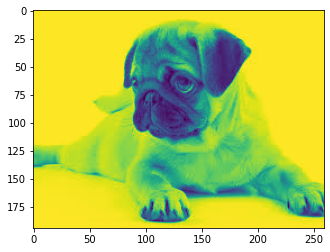

In [ ]:
plt.imshow(img)

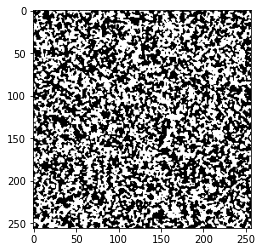

In [ ]:
plt.imshow(real -1, cmap = 'gray')

In [ ]:
ssim(real, real2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


0.006128708754401299

In [ ]:
calc_sjhcorr2(real2, fake)

[[1.         0.01368566]
 [0.01368566 1.        ]]
[0.00010131]
[0.0001018]


array([[0.40510997, 0.01989822],
       [0.01989822, 0.40510997]])

In [ ]:
calc_sjhcorr2(real, fake)

[[ 1.         -0.00918318]
 [-0.00918318  1.        ]]
[1.95941616e-06]
[2.10113539e-06]


array([[0.46911539, 0.13956196],
       [0.13956196, 0.46911539]])

In [ ]:
calc_sjhcorr2(real, real2)

[[ 1.         -0.00255413]
 [-0.00255413  1.        ]]
[0.00012779]
[0.00013703]


array([[0.46911539, 0.14305625],
       [0.14305625, 0.46911539]])

In [ ]:
calc_sjhcorr2(real, np.flipud(real))

[[1.         0.00201524]
 [0.00201524 1.        ]]
[0.]
[0.]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


array([[nan, nan],
       [nan, nan]])

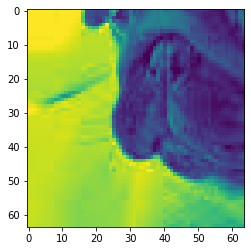

In [ ]:
plt.imshow(img[64:128, 64:128])
#plt.imshow(img2[64:128, 64:128])

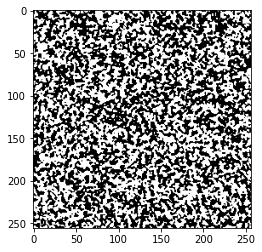

In [ ]:
real2 = read_store_data('/content/22.txt')

In [ ]:
calc_sjhcorr2(img[64:128, 64:128] ,img2[64:128, 64:128])

0.09813512773346711
27.111619541765187


0.9388844029474149

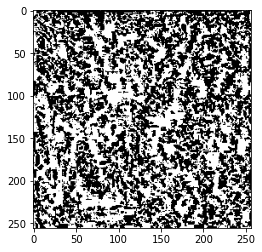

In [ ]:
fake = read_store_data('/content/generated_with_threshold.txt')

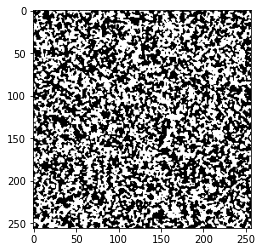

In [ ]:
real = read_store_data('/content/real.txt')

In [ ]:
calc_sjhcorr2(real, real)

error: ignored

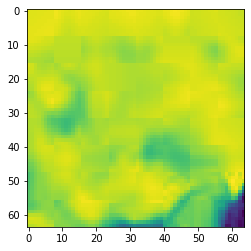

In [ ]:
plt.imshow(img2[0:64, 0:64])

In [ ]:
np.corrcoef(np.ndarray.flatten(img[64:128, 64:128]), np.ndarray.flatten(img2[64:128, 64:128]))

array([[1.        , 0.09813513],
       [0.09813513, 1.        ]])

In [ ]:
read_store